#### imports

In [1]:
# SSIM para os histogramas 
# constancia de cor, erro angular
# universal constancia cor

In [2]:
# !conda install numba -y

In [3]:
import os
import cv2
from sklearn.cluster import k_means, KMeans
# from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, ClassifierMixin, ClusterMixin
# from sklearn.datasets import load_iris
# from sklearn.model_selection import train_test_split
import numpy as np
from numba import njit

import matplotlib.pyplot as plt
import pandas as pd
import json
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

from sklearn.metrics.cluster import adjusted_rand_score #, ran
# from sklearn import datasets
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
%matplotlib inline

#### Pre-processing

In [4]:
class Cleaner(BaseEstimator, TransformerMixin):
  def __init__(self):
    super()
  
  def read_dataset(self, filename):
    X = pd.read_csv(filename, header=None, delim_whitespace=True)
    y = pd.DataFrame({X.shape[1]: np.arange(0, X.shape[0])//200})
    return X, y
  def fit(self, X, y):
    return self
  
  def transform(self, X: pd.DataFrame, y=pd.DataFrame):
    y_lenth = len(y)
    if y_lenth:
      # key = "class"
      # y = pd.DataFrame({key: y})
      values = pd.concat([X, y], axis=1)
    else:
      values = X.copy()

    values = values.dropna()
    values = values.drop_duplicates()
    if y_lenth:
      return values[X.columns.values], values[values.columns.values[-1]]
    return values
  
  def fit_transform(self, X, y=pd.DataFrame):
      return self.fit(X, y).transform(X, y)
  
class Transformer(BaseEstimator, TransformerMixin):
  def __init__(self):
    super()
  def fit(self, X, y=None):
    return self
  def transform(self, X, y=None):
    if type(X) == np.ndarray:
      return X
    return X.values
  def fit_transform(self, X, y=None):
    return self.fit(X, y).transform(X, y)

### Model

##### Metrics

In [5]:
def uqi(img1, img2):
    """
    Calculate the Universal Quality Image Index (UQI) between two images.

    Parameters:
    img1 (numpy array): First image (reference image).
    img2 (numpy array): Second image (image to be compared).

    Returns:
    float: UQI value between -1 and 1.
    """
    assert img1.shape == img2.shape, "Images must have the same dimensions"
    
    N = img1.size
    
    # Means
    mean1 = np.mean(img1)
    mean2 = np.mean(img2)
    
    # Variances and covariance
    var1 = np.var(img1)
    var2 = np.var(img2)
    covar = np.mean((img1 - mean1) * (img2 - mean2))
    
    # UQI calculation
    numerator = 4 * covar * mean1 * mean2
    denominator = (var1 + var2) * (mean1**2 + mean2**2)
    
    if denominator == 0:
        return 1 if numerator == 0 else 0
    
    uqi_value = numerator / denominator
    return uqi_value

def calculate_histogram(image, bins=256):
    """
    Calculate the histogram of an image.
    
    Parameters:
    image (numpy array): Input image.
    bins (int): Number of bins for the histogram.
    
    Returns:
    numpy array: Histogram of the image.
    """
    hist = [cv2.calcHist(images=[image], channels=[channel], mask=None, histSize = [bins], ranges=[0, 256]) \
            for channel in range(3)]
    # hist = cv2.normalize(hist, hist).flatten()
    return hist

def ssim_histogram(hist1, hist2, C1=1e-4, C2=9e-4):
    """
    Calculate SSIM between two histograms.
    
    Parameters:
    hist1 (numpy array): Histogram of the first image.
    hist2 (numpy array): Histogram of the second image.
    C1 (float): Constant to avoid division by zero.
    C2 (float): Constant to avoid division by zero.
    
    Returns:
    float: SSIM value.
    """
    def hist_ssim(hist1, hist2):
        mu_x = np.mean(hist1)
        mu_y = np.mean(hist2)
        sigma_x = np.var(hist1)
        sigma_y = np.var(hist2)
        sigma_xy = np.mean((hist1 - mu_x) * (hist2 - mu_y))
        
        return ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / ((mu_x ** 2 + mu_y ** 2 + C1) * (sigma_x + sigma_y + C2))
    
 
    hssim = [hist_ssim(hist1[channel], hist2[channel]) for channel in range(3)]
    
    return np.mean(hssim)

def metricas(image1, image2):
    uqi_value = uqi(image1, image2)

    hist1 = calculate_histogram(image1)
    hist2 = calculate_histogram(image2)

    # Calcular SSIM entre histogramas
    ssim = ssim_histogram(image1, image2)
    hssim = ssim_histogram(hist1, hist2)
    print(f"SSIM : {ssim:.4f}")
    print(f"SSIM entre histogramas: {hssim:.4f}")
    print(f"UQI: {uqi_value:.4f}")
    return ssim, hssim, uqi_value

In [6]:
class Gaussian:
  def distance(self, g, x, sigma):
    if x.shape[0] == 0 or sigma.shape[0] == 0:
      raise Exception
    distance = np.square(np.subtract(x, g)) #**2
    distance_sigma = distance / sigma
    summatory_distance = (-1/2)*np.sum(distance_sigma, 1)
    return np.exp(summatory_distance)

class Metrics:
  def mpc(u: np.array):
    # modified partition coefficient
    n, k = u.shape
    f = np.trace(u.dot(u.T)) / n

    mpc = 1 - (k/(k - 1))*(1 - f)
    return mpc
  def ars(y_true, y_pred):
    # adjusted rand score
    return adjusted_rand_score(y_true, y_pred)

##### Shower

In [7]:
class Shower:
    def show_grafico(self, x):
        _, axes = plt.subplots()
        markers = ["^", "x", "+"]
        p = self.predict(self.G, x)

        for c, (x_1, x_2) in zip(p, x):
            r, g, b, a = (
                0.9 * ((c + 1) / self.num_class),
                0.9 * ((c * 1.1) / self.num_class),
                0.9 * ((c * 1.2) / self.num_class),
                0.1,
            )

            axes.plot(x_1, x_2, "ro", marker=markers[c])

        raio = self.distance_classes() / 2

        for i, (x_1, x_2) in enumerate(self.G):

            plt.plot(x_1, x_2, "go", scalex=0.01, scaley=0.01)
            r, g, b, a = (
                0.9 * ((i + 1) / self.num_class),
                0.9 * ((i * 1.1) / self.num_class),
                0.9 * ((i * 1.2) / self.num_class),
                0.9,
            )
            c = plt.Circle((x_1, x_2), raio, color=(r, g, b, a), fill=False)

            axes.set_aspect(aspect=1, adjustable="datalim", anchor="SW")
            axes.add_artist(c)
        plt.show()

    def show_caracteristicas(self, epoch):
        def cores(colors, title, ax):

            if (colors.max(1) > 1).any():
                colors_formating = (colors.T / colors.max(1)).T
            else:
                colors_formating = colors.copy()
                # Criando uma figura
            # fig, ax = plt.subplots(figsize=(colors.shape[0], 1))

            # Desenhando retângulos coloridos
            for i, color in enumerate(colors_formating):
                ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=color))

            # Configurando o eixo
            ax.set_xlim(0, colors.shape[0])
            ax.set_ylim(0, 1)
            ax.set_xticks(np.arange(0.5, colors.shape[0] + 0.5))
            formata_numeros = lambda numeros: ",".join(
                ["{:.1f}".format(numero) for numero in numeros]
            )
            ax.set_xticklabels(
                [f"{formata_numeros(colors[i])}" for i in range(colors.shape[0])],
                fontsize=7,
            )
            ax.set_yticks([])
            ax.set_aspect("equal")
            ax.set_title(title)

        fig, axs = plt.subplots(ncols=1, nrows=2, figsize=(self.G.shape[0]*3, 3))

        cores(self.G, f"prototipo - {epoch}", axs[0])
        cores(self.sigma, f"sigma - {epoch}", axs[1])
        # plt.legend()
        plt.tight_layout(h_pad=0.1, w_pad=0.1)
        plt.show()

    def show_function_objetive(self, data_f, params):
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 4))

        # plot box plot
        axs[0].boxplot(data_f)
        # axs[0].set_title('funcão objetivo e m ')
        axs[0].yaxis.grid(True)
        axs[0].set_xticks([y + 1 for y in range(len(data_f))], labels=params)
        axs[0].set_xlabel("m")
        axs[0].set_ylabel("f")

        plt.show()

    def show_labels(self, x, filename):
        # Data
        k, n = x.shape
        plt.figure(figsize=(20, 6))

        # Labels
        xlabs = np.arange(k)
        ylabs = np.arange(n)

        # Heat map
        _, ax = plt.subplots(constrained_layout=True)

        # ax.figure()
        ax.set_axis_off()  # = [0.1, 0.1, 0.8, 0.8] #.add_axes()
        ax.imshow(x)
        if n < 10:
            # Add the labels
            ax.set_xticks(ylabs)
            ax.set_yticks(xlabs)

            # Add the values to each cell
            for i in range(len(xlabs)):
                for j in range(len(ylabs)):
                    _ = ax.text(
                        j,
                        i,
                        round(x[i, j], 1),
                        ha="center",
                        va="center",
                        color=(0, 0, 0),
                    )  # "w"
        if filename:
            plt.savefig(filename, dpi=150)
        plt.show()

    def show_G_S(self, folder):
        # show the values of Gs and S(widths)
        if not os.path.isdir(folder):
            os.makedirs(folder)
        print("Gs")
        self.show_labels(self.G, f"{folder}/G")
        print("S2s")
        self.show_labels(self.sigma, f"{folder}/sigma")

##### Base Model

In [8]:
class Model:
    def __init__(self, loss=Gaussian(), var_type=np.float32) -> None:
        # model base
        self.loss = loss
        np.float32 = var_type

    def predict(self, X, is_preprocessing=False, argmax=True):
        # here we make predict in x
        n = X.shape[0]
        k = self.G.shape[0]

        if is_preprocessing:
            X = self.preprocesssing(X)
        u = np.zeros((n, k), np.float32)

        distances = np.array(
            [2 - 2 * self.loss.distance(self.G[i], X, self.sigma[i]) for i in range(k)]
        ).T

        expoente = 1 / (self.m - 1)

        for i in range(n):

            ds = distances[i] == 0
            if (ds).any():
                summation_c_i_1 = np.zeros((k))
                summation_c_i_1[ds] = 1
            else:
                summation_c = np.array(
                    [((distances[i] / distances[i, h]) ** expoente) for h in range(k)]
                )  # .T

                summation_c_i = np.sum(summation_c, 0)
                summation_c_i_1 = np.power(summation_c_i, -1)

            u[i] = summation_c_i_1.copy()
        if argmax:
            return u.argmax(1)
        return u
        # if argmax:

    def set_g(self, g):
        self.G = g.copy()

    def set_sigma(self, sigma):
        self.sigma = sigma.copy()

    def preprocesssing(self, X):
        pipeline = Pipeline(
            [
                ("MinMaxScaler", MinMaxScaler()),
                ("Transformer", Transformer()),
            ]
        )

        return pipeline.transform(X)

    def save_model(self, filename):
        # Save the model in json file
        json_object = json.dumps(
            {"G": self.G.tolist(), "sigma": self.sigma.tolist(), "m": self.m}, indent=2
        )  #
        # Writing to sample.json
        folder = "/".join(filename.split("/")[:-1])
        if not os.path.isdir(folder):
            os.makedirs(folder)

        with open(filename, "w") as outfile:
            outfile.write(json_object)

    def load_model(self, filename):
        # Reading from json file
        with open(filename, "r") as openfile:
            json_object = json.load(openfile)
            self.G = np.array(json_object["G"])
            self.sigma = np.array(json_object["sigma"])
            self.m = json_object["m"]


##### FuzzyCMeansGaussianS2

In [9]:
# tá funcionando bonitinho
import math

class FuzzyCMeansGaussianS2(Shower, Model):
    def __init__(
        self,
        num_class,
        epochs,
        threshold,
        loss=Gaussian(),
        m=1.1,
        seeder=None,
        verbose=False,
    ) -> None:
        # load the hiperparams
        super().__init__(loss=loss, var_type=np.float32)
        self.num_class = num_class
        self.m = m
        self.verbose = verbose
        if seeder:
            self.seeder = seeder
            np.random.seed(seeder)

        self.threshold = threshold
        self.epochs = epochs
    # @njit
    def init_g(self, x: np.ndarray):
        # here we get random prototipes to train
        unicos = np.unique(x, axis=0)
        args = np.random.choice(unicos.shape[0], self.num_class, replace=False)
        self.G = unicos[args].copy()
    # @njit
    def init_u(self, x):
        # we calcule initial matrix of membership
        g = self.G.copy()
        sigma = self.sigma.copy()
        self.n = x.shape[0]
        self.k = g.shape[0]

        self.U = np.zeros((self.n, self.k), np.float32)

        distances = np.array(
            [2 - 2 * self.loss.distance(g[i], x, sigma[i]) for i in range(self.k)]
        ).T

        expoente = 1 / (self.m - 1)

        for i in range(self.n):
            # summation_c = np.array([(distances[i, h] / distances[i])**expoente for h in range(self.k)])
            # np.divide
            # summation_c = np.array([(distances[i] / distances[i, h])**expoente for h in range(self.k)]) #.T
            ds = distances[i] == 0
            if (ds).any():
                summation_c_i_1 = np.zeros((self.k))
                summation_c_i_1[ds] = 1
                self.U[i] = summation_c_i_1.copy()

            else:
                summation_c = np.array(
                    [
                        ((distances[i] / distances[i, h]) ** expoente)
                        for h in range(self.k)
                    ]
                )  # .T

                summation_c_i = np.sum(summation_c, 0)
                summation_c_i_1 = np.power(summation_c_i, -1)

                membership_is_nan = np.isnan(summation_c_i_1)

                summation_u = np.sum(summation_c_i_1, where=membership_is_nan == False)

                summation_u_1 = 1 - summation_u
                abs_summation_u_1 = np.abs(summation_u_1)

                if abs_summation_u_1 > 0.01:
                    arg = summation_c_i_1.argmax()
                    summation_c_i_1[arg] = summation_c_i_1[arg] + summation_u_1

                    self.U[i] = summation_c_i_1.copy()
                else:
                    self.U[i] = summation_c_i_1.copy()
    # @njit
    def init_sigma(self, x):
        # we calcule initial matrix of widths each 1
        self.p = x.shape[1]
        self.k = self.G.shape[0]
        self.sigma = np.ones((self.k, self.p), dtype=np.float32)

    # passo 1
    # @njit 
    def otm_prototivo(self, g, u, x, sigma):
        new_g = g.copy()
        u_i = u**self.m

        for i in range(self.k):
            n_g = self.loss.distance(g[i], x, sigma[i])

            u_m_g = u_i[:, i] * n_g  # *
            u_m_gx = ((x.T) * u_m_g).T

            s_umg = np.sum(u_m_g)
            s_umgx = np.sum(u_m_gx, 0)

            new_g[i] = s_umgx / s_umg
        return new_g

    # passo 2
    # @njit 
    def otm_u(self, g, x, sigma):
        new_u = np.zeros((self.n, self.k), dtype=np.float32)

        distances = np.array(
            [2 - 2 * self.loss.distance(g[i], x, sigma[i]) for i in range(self.k)]
        ).T

        expoente = 1 / (self.m - 1)
        for i in range(self.n):

            ds = distances[i] == 0
            if (ds).any():
                summation_c_i_1 = np.zeros((self.k))
                summation_c_i_1[ds] = 1
                new_u[i] = summation_c_i_1.copy()

            else:
                summation_c = np.array(
                    [
                        ((distances[i] / distances[i, h]) ** expoente)
                        for h in range(self.k)
                    ]
                )  # .T

                summation_c_i = np.sum(summation_c, 0)

                summation_c_i_1 = np.power(summation_c_i, -1)

                membership_is_nan = np.isnan(summation_c_i_1)

                summation_u = np.sum(summation_c_i_1, where=membership_is_nan == False)

                summation_u_1 = 1 - summation_u
                abs_summation_u_1 = np.abs(summation_u_1)
                # if

                if summation_u == 0 or membership_is_nan.any():
                    count = np.sum(membership_is_nan)  # total nan
                    new_u[i] = np.nan_to_num(summation_c_i_1, nan=summation_u_1 / count)
                elif abs_summation_u_1 > 0.01:
                    arg = summation_c_i_1.argmax()
                    summation_c_i_1[arg] = summation_c_i_1[arg] + summation_u_1

                    new_u[i] = summation_c_i_1.copy()
                else:
                    new_u[i] = summation_c_i_1.copy()
        return new_u
    
    # @njit 
    def otm_sigma(self, x, g, u):
        s = self.sigma.copy()

        ui = u ** (self.m)

        for i in range(self.k):
            g_i = g[i]
            ui_per = ui[:, i]

            g_d = self.loss.distance(g_i, x, s[i])
            e_d = (x - g_i) ** 2

            s_cn = e_d.T * (ui_per * g_d)

            if s_cn.shape[1] != 1:
                ss_cn = np.sum(s_cn, 1).copy()
            else:
                ss_cn = np.squeeze(s_cn, 1).copy()

            s_p = np.prod(ss_cn)
            s_p = s_p ** (1 / self.p)

            s_ij = s_p / ss_cn

            r_r = s_ij[np.isnan(s_ij) == False]
            p_r = np.prod(r_r)

            s_r = np.abs(1 - p_r)

            # verificacao do produtorio para a classe que deve ser 1
            if p_r == 0:
                teste = False

                if teste:
                    m_s = np.sum(ss_cn) / (self.p)

                # ss_cn = ss_cn*(1/m_s)
                if teste:
                    im_s = 1 / (m_s)
                    new_ss_cn = ss_cn * im_s
                else:
                    new_ss_cn = 1 - ss_cn  # **(1/(self.p))

                new_s_p = np.prod(new_ss_cn)

                new_s_p = new_s_p ** (1 / self.p)

                new_r = new_s_p / new_ss_cn

                prod = np.prod(new_r)

                if np.isnan(prod) == False:
                    s[i] = new_r.copy()

            elif s_r > 0.1:
                # para quando o produtorio de Ss dá diferente de 1
                if r_r.shape[0] == s_ij.shape[0]:
                    s[i] = s_ij / (p_r ** (1 / s_ij.shape[0]))
                else:
                    s_prod = 1 / (p_r ** (1 / s_ij.shape[0]))
                    s[i] = np.nan_to_num(s_ij, copy=True, nan=s_prod)
            else:
                s[i] = s_ij.copy()

        return s
    
    def otm_m(self, x, g, u, s):
        m = 2
        s_p = 0

        for i in range(self.k):
            g_i = g[i]
            ui_per = u[:, i]

            g_d = (2 - 2*self.loss.distance(g_i, x, s[i]))

            s_cn = ( math.log(g_d) / math.log(ui_per)) 

            if s_cn.shape[1] != 1:
                ss_cn = np.sum(s_cn, 1).copy()
            else:
                ss_cn = np.squeeze(s_cn, 1).copy()

            s_p += ss_cn
        m = s_p / self.k

        return m
    # @njit 
    def funcao_objetivo(self, x, g, u, sigma):
        # k = g.shape[0]
        u_i = u**self.m
        f = np.zeros(self.k, dtype=np.float32)

        s_d = np.zeros(x.shape[0], dtype=np.float32)
        w = np.zeros(x.shape[0], dtype=np.float32)
        for i in range(self.k):
            s_d = 2 - 2 * self.loss.distance(g[i], x, sigma[i])

            w = s_d.T * (u_i[:, i])
            f[i] = np.sum(w)

        return np.sum(f)
    
    # @njit 
    def atualiza_GUS2(self, g, u, sigma):
        self.G = g
        self.U = u
        self.sigma = sigma
    
    # @njit 
    def fit(self, x, y, verbose=False):
        self.redu = True

        self.init_g(x)
        self.init_sigma(x)
        self.init_u(x)

        j = self.funcao_objetivo(x, self.G, self.U, self.sigma)
        if self.verbose:
            print("epoca:", 0, "funcão objetivo:", j)  # , new_f

        for epoch in range(self.epochs):
            # new_m = self.otm_m(x, self.G, self.U, self.sigma)
            # "passo 1"
            new_sigma = self.otm_sigma(x, self.G, self.U)

            # "passo 2"
            new_g = self.otm_prototivo(self.G, self.U, x, new_sigma)

            # "passo 3"
            new_u = self.otm_u(new_g, x, new_sigma)

            # new_m = self.otm_m(x, new_g, new_u, new_sigma)

            new_j = self.funcao_objetivo(x, new_g, new_u, new_sigma)
            # print(new_m)
            if self.verbose:
                print(f"epoca: {epoch + 1} funcão objetivo: {new_j}")  # f,
                # print(
                #     f"Modified partition coefficient  {Metrics.mpc(self.U)},  {Metrics.ars(y, self.U.argmax(1))}"
                # )  # f,

            # silhouette_score
            if self.verbose:
                self.show_caracteristicas(epoch)
                # self.show_grafico(x)

            dif = np.abs(new_j - j)
            # new_j > j
            if np.isnan(new_j) == True or dif < self.threshold:
                return
            else:
                j = new_j
                self.atualiza_GUS2(new_g, new_u, new_sigma)


##### Trainer

In [10]:
class Trainer(FuzzyCMeansGaussianS2):
    def __init__(
        self,
        num_class,
        epochs,
        threshold,
        model_creator,
        filename,
        loss=Gaussian(),
        m=1.1,
        verbose=False,
        repeat=1,
    ) -> None:
        # load the hiperparams
        super().__init__(num_class, epochs, threshold, loss=loss, m=m)
        self.num_class = num_class
        np.float32 = np.float32
        self.verbose = verbose
        self.threshold = threshold
        self.epochs = epochs
        self.repeat = repeat
        self.model_creator = model_creator
        self.filename = filename
        self.metrics = {
            "objetive_function": [],
            "mpc": [],
            "ars": [],
        }

    def fit(self, X, y):
        j = np.inf

        for i in range(self.repeat):
            model = self.model_creator(
                num_class=self.num_class,
                epochs=self.epochs,
                threshold=self.threshold,
                loss=self.loss,
                m=self.m,
                verbose=self.verbose,
            )
            model._only = False
            model.fit(X, y)
            new_j = model.funcao_objetivo(X, model.G, model.U, model.sigma)
            new_mpc = Metrics.mpc(model.U)
            new_ars = Metrics.ars(y, model.U.argmax(1))

            print(f"repeation: {i + 1} funcão objetivo: {new_j}")
            print(
                f"Modified partition coefficient: {new_mpc},  adjusted rand score: {new_ars}"
            )

            self.metrics["objetive_function"].append(new_j)
            self.metrics["mpc"].append(new_mpc)
            self.metrics["ars"].append(new_ars)

            if new_j < j:
                self.G = model.G
                self.U = model.U
                self.sigma = model.sigma
                j = new_j

        self.save_model(f"./model/{self.m}/{self.filename}")
        self.save(f"./metrics/{self.m}/{self.filename}")

    def save(self, filename):
        if not len(self.metrics["objetive_function"]):
            print("the models is not fit")
            return
        # Save the model in json file
        json_object = json.dumps(self.metrics, indent=2)  #
        # Writing to sample.json
        folder = "/".join(filename.split("/")[:-1])
        if not os.path.isdir(folder):
            os.makedirs(folder)

        with open(filename, "w") as outfile:
            outfile.write(json_object)

##### Custom model

In [11]:
# Definindo a variável de ambiente temporariamente
os.environ["OMP_NUM_THREADS"] = "2"
# Classe do Modelo Personalizado
class CustomModel(BaseEstimator, ClusterMixin):
    def __init__(self, param1=1, param2=1, **kwargs):
        super(CustomModel).__init__(**kwargs)
        self.param1 = param1
        self.param2 = param2
        self.kmeans = KMeans(n_clusters=self.param1, n_init=10)

    def fit(self, X, y):
        # Implemente aqui o código para treinar o modelo com os parâmetros
        self.kmeans.fit(X, y) 
        

    def predict(self, X):
        # Implemente aqui o código para fazer previsões
        return self.kmeans.predict(X)

    def get_params(self, deep=True):
        return {'param1': self.param1, 'param2': self.param2}

    def set_params(self, **params):
        for param, value in params.items():
            setattr(self, param, value)
        return self

# Carregando o conjunto de dados Iris
# iris = load_iris()
# X = iris.data
# y = iris.target

# # Dividindo o conjunto de dados em conjuntos de treinamento e teste
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Definindo o modelo personalizado
# custom_model = CustomModel()

# # Definindo o espaço de parâmetros a serem testados
# param_grid = {
#     'param1': list(range(1, 6)),
#     'param2': [0.1, 0.01, 0.001]
# }

# # Criando um objeto GridSearchCV com o modelo personalizado, espaço de parâmetros e métrica de avaliação
# grid_search = GridSearchCV(estimator=custom_model, param_grid=param_grid, cv=5, scoring='rand_score')

# # Ajustando o GridSearchCV aos dados de treinamento
# grid_search.fit(X_train, y_train)

# # Exibindo os melhores parâmetros encontrados
# print("Melhores parâmetros:", grid_search.best_params_)

# # Exibindo a melhor pontuação alcançada
# print("Melhor pontuação:", grid_search.best_score_)

# # Avaliando o desempenho do modelo otimizado nos dados de teste
# accuracy = grid_search.score(X_test, y_test)
# print("Acurácia nos dados de teste:", accuracy)


### colect data

#### eBDtheque_database_v3 Page CYB_COSMOZONE

In [12]:
resultados = []
model_modo = "minimal_show"

In [13]:
# from Pill import Image 
from PIL import Image #, ImageDraw, ImageFont

img_path = "./datasets/eBDtheque_database_v3/Pages/CYB_COSMOZONE_012.jpg"

image = np.array(Image.open(img_path).convert("RGB"))
# image_shape_out = 320, 320, 3
image_shape_out = image.shape

print(image.shape)
X = image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]].reshape(-1, image_shape_out[2]) /255
print(X.shape)

(661, 569, 3)
(376109, 3)


In [14]:
# image 출력 함수 정의
def show_img_bbox(X, y):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate([X, y]):
        plt.subplot(1, 2, i + 1)
        plt.imshow(img)

#### c = 20

##### fit

epoca: 0 funcão objetivo: 5166.6367
epoca: 1 funcão objetivo: 3195.506103515625


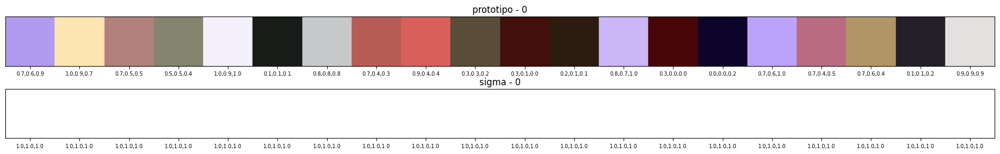

epoca: 2 funcão objetivo: 2792.955810546875


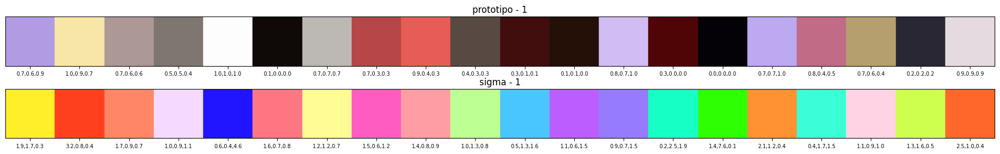

epoca: 3 funcão objetivo: 2692.6435546875


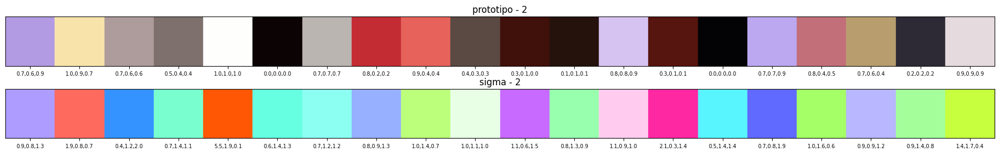

epoca: 4 funcão objetivo: 2484.961669921875


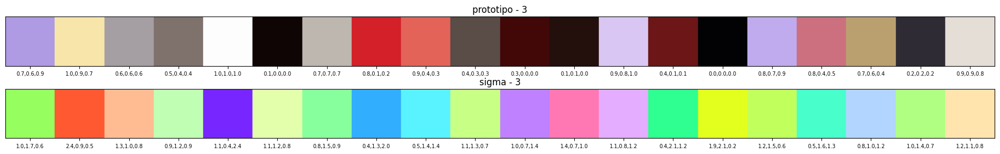

epoca: 5 funcão objetivo: 2468.98828125


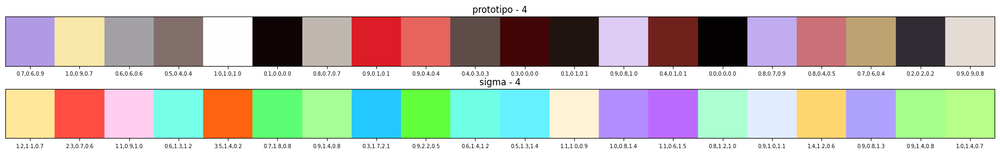

epoca: 6 funcão objetivo: 2348.599365234375


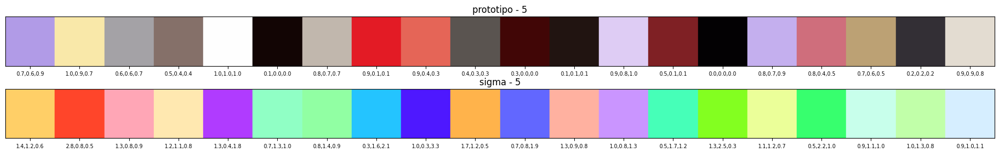

epoca: 7 funcão objetivo: 2348.791259765625


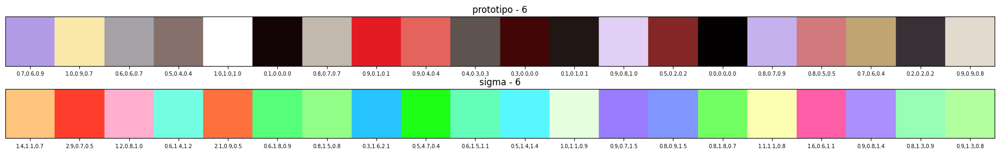

In [15]:
model = FuzzyCMeansGaussianS2(num_class=20, epochs=50, threshold=.5, verbose=True)
model.fit(X, None)

In [16]:
y = model.predict(X)

In [17]:
model.G

array([[0.69644453, 0.61072917, 0.91011793],
       [0.97998604, 0.9100918 , 0.66075909],
       [0.64287558, 0.63712806, 0.65329965],
       [0.52260614, 0.44075064, 0.42107935],
       [0.99688541, 0.99541453, 0.9953558 ],
       [0.07486649, 0.01675408, 0.02045696],
       [0.7623679 , 0.72071359, 0.67932261],
       [0.89537215, 0.1061242 , 0.14196354],
       [0.89651594, 0.38815367, 0.36420129],
       [0.37428934, 0.32474537, 0.30945948],
       [0.25881381, 0.02172534, 0.02507866],
       [0.12591916, 0.09198493, 0.07735257],
       [0.88068239, 0.81104505, 0.96181571],
       [0.52135094, 0.15192054, 0.15223522],
       [0.01354817, 0.00584308, 0.00898537],
       [0.77465649, 0.69287165, 0.93678036],
       [0.81920713, 0.47536231, 0.4920257 ],
       [0.74898481, 0.64695708, 0.44558208],
       [0.21619903, 0.19013305, 0.20374119],
       [0.88735726, 0.8540219 , 0.80874916]])

In [18]:
model.sigma

array([[1.3862455 , 1.0650694 , 0.6773013 ],
       [2.8663085 , 0.6898886 , 0.50570595],
       [1.219949  , 0.83127165, 0.9860873 ],
       [0.6145712 , 1.3507174 , 1.2046566 ],
       [2.1001363 , 0.921635  , 0.5166466 ],
       [0.6190259 , 1.8468971 , 0.87467855],
       [0.84900945, 1.4821041 , 0.79471016],
       [0.30837318, 1.5754334 , 2.0583696 ],
       [0.5322904 , 4.677676  , 0.40162545],
       [0.5930545 , 1.5237594 , 1.1065959 ],
       [0.4947223 , 1.4002935 , 1.4435089 ],
       [0.9754864 , 1.0827879 , 0.94675016],
       [0.9071209 , 0.7283641 , 1.5135134 ],
       [0.7605902 , 0.87569827, 1.5013944 ],
       [0.80052805, 1.792375  , 0.6969387 ],
       [1.1180216 , 1.1317893 , 0.7902858 ],
       [1.6097983 , 0.5899819 , 1.0529066 ],
       [0.9343915 , 0.7741008 , 1.382527  ],
       [0.78950435, 1.335925  , 0.94812024],
       [0.9159649 , 1.323339  , 0.8249926 ]], dtype=float32)

In [19]:
y_image = (model.G[y].reshape(image_shape_out)*254).astype(np.uint8)

In [20]:
import cv2
filename = img_path.split("/")[-1]
set_name = f"results/{model_modo}/cmeans/comics/"
dir_out_model = f"{set_name}model/20/model.json"
model.save_model(dir_out_model)

print(str.upper(filename.split(".")[-1]))
dir_out_img = f"{set_name}imgs/20/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)
Image.fromarray(y_image).save(f"{dir_out_img}{filename}")
ssim, hssim, q = metricas(image, y_image)
resultados.append([ssim, hssim, q])

JPG
SSIM : 0.0040
SSIM entre histogramas: 0.0436
UQI: 0.9898


##### show

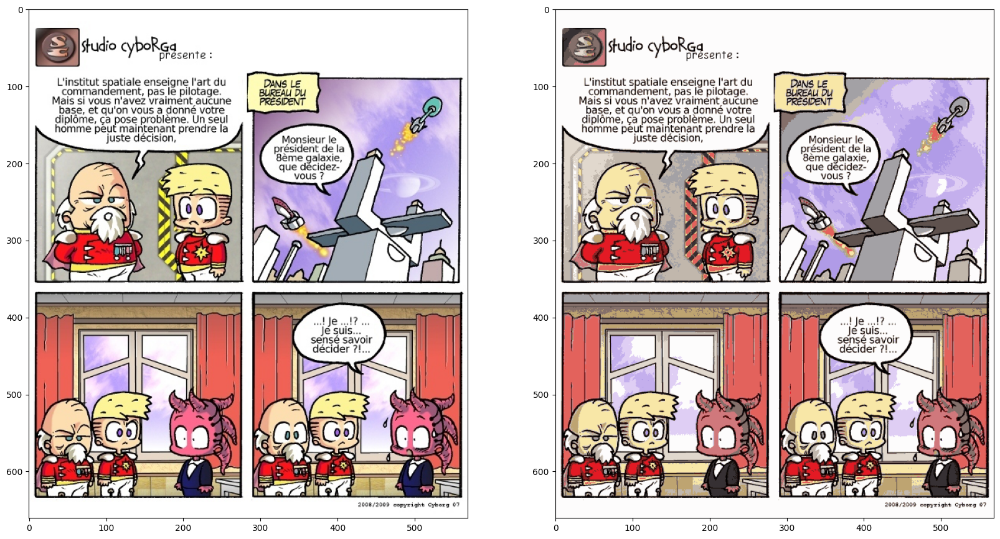

In [21]:
show_img_bbox(image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]], y_image)

#### c = 10

##### fit

epoca: 0 funcão objetivo: 12600.69
epoca: 1 funcão objetivo: 8477.3525390625


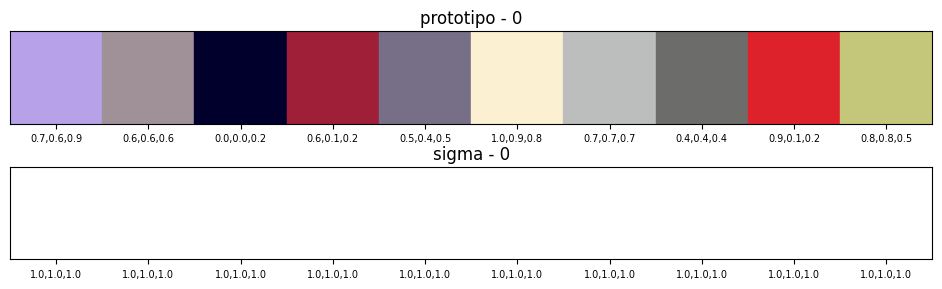

epoca: 2 funcão objetivo: 4993.86083984375


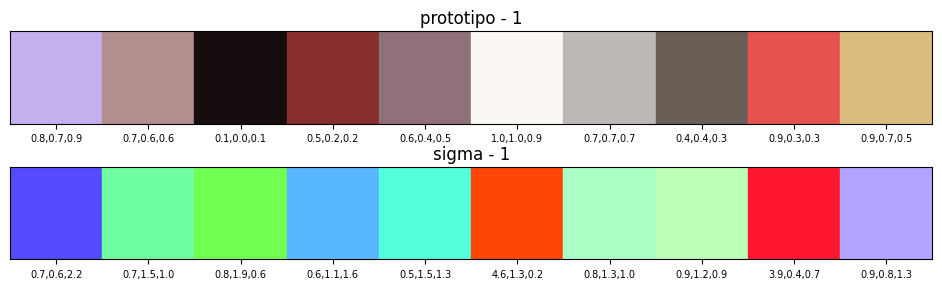

epoca: 3 funcão objetivo: 4760.51513671875


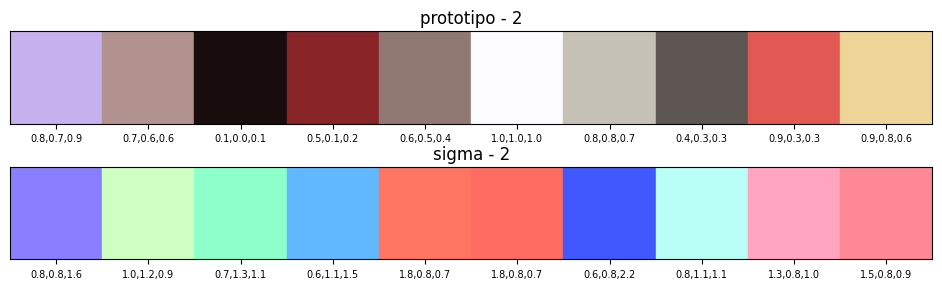

epoca: 4 funcão objetivo: 4689.9169921875


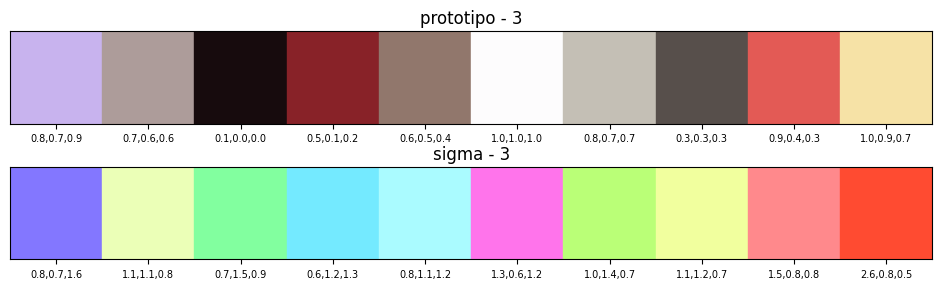

epoca: 5 funcão objetivo: 4653.62744140625


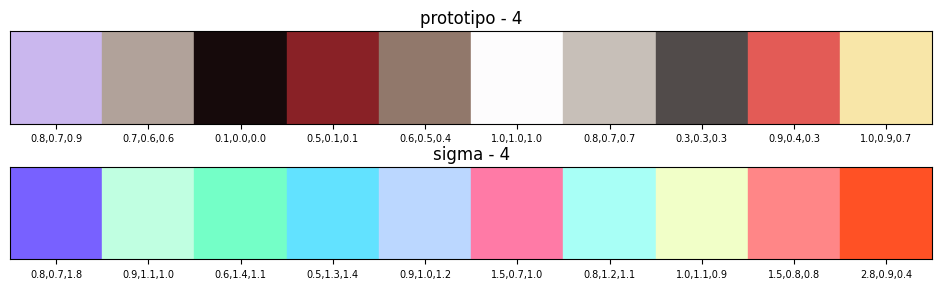

epoca: 6 funcão objetivo: 4651.53662109375


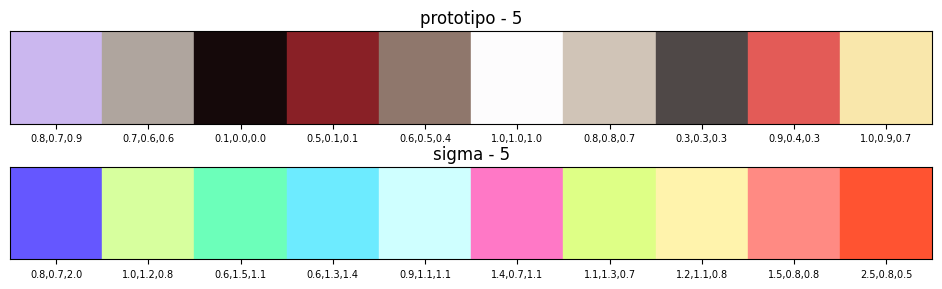

epoca: 7 funcão objetivo: 4531.66845703125


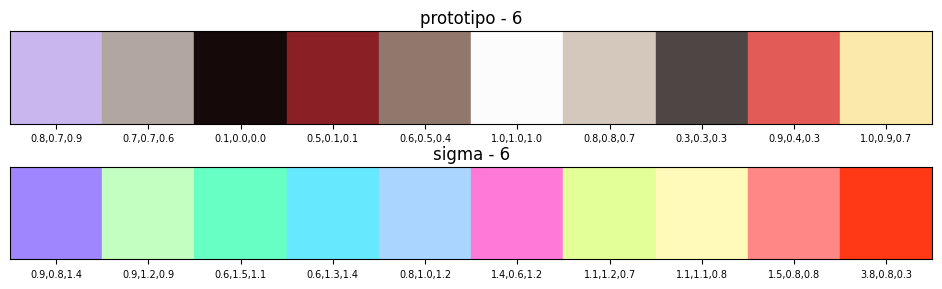

epoca: 8 funcão objetivo: 4676.56005859375


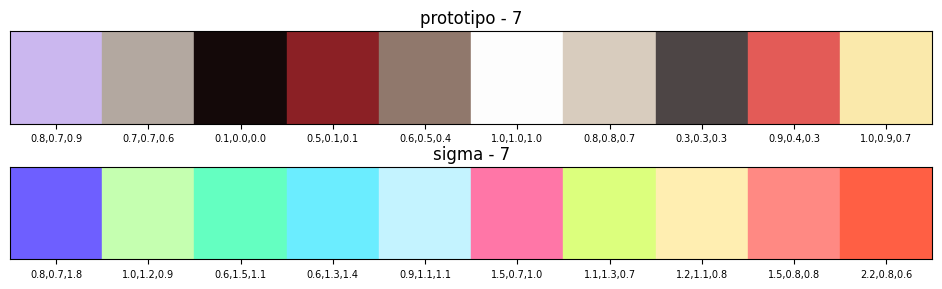

epoca: 9 funcão objetivo: 4392.4541015625


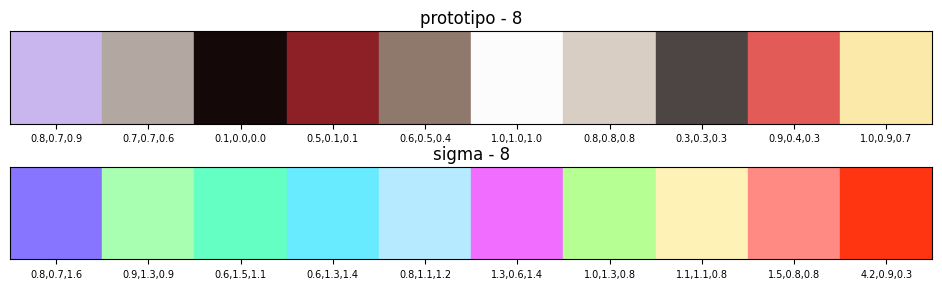

epoca: 10 funcão objetivo: 4682.09619140625


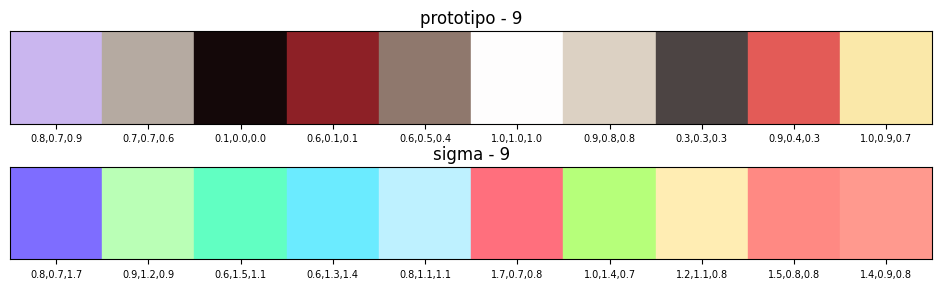

epoca: 11 funcão objetivo: 4351.1513671875


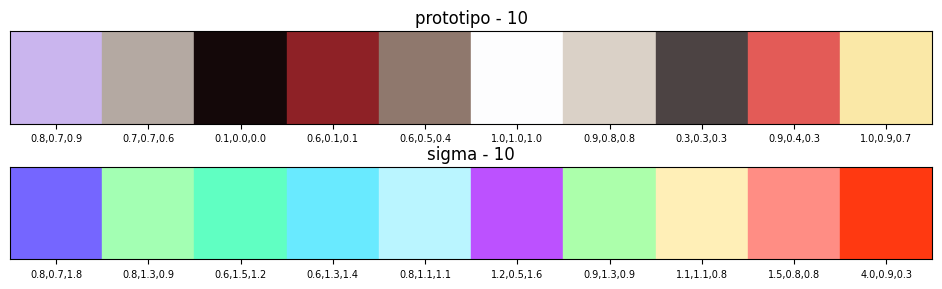

epoca: 12 funcão objetivo: 4590.3935546875


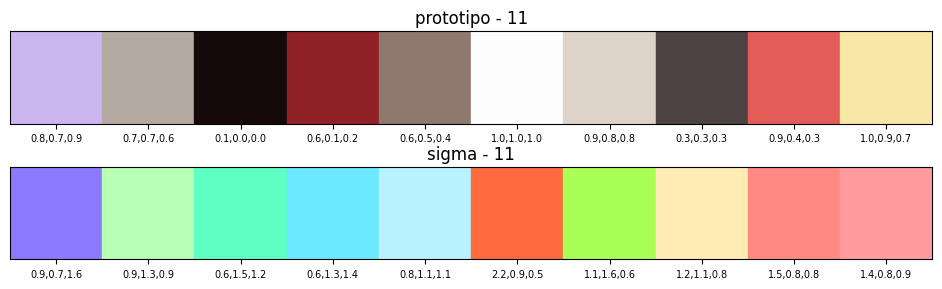

epoca: 13 funcão objetivo: 4382.00732421875


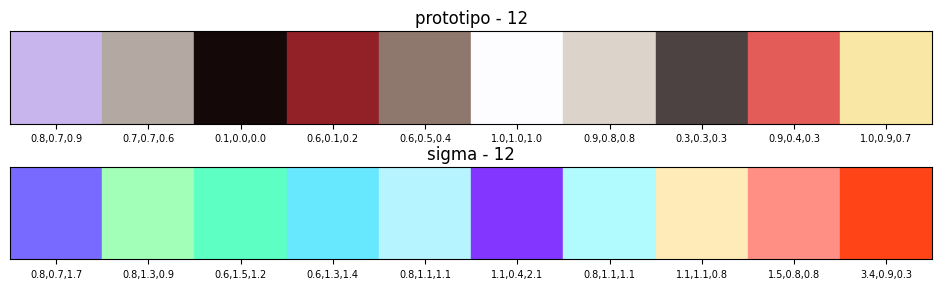

epoca: 14 funcão objetivo: 4462.10205078125


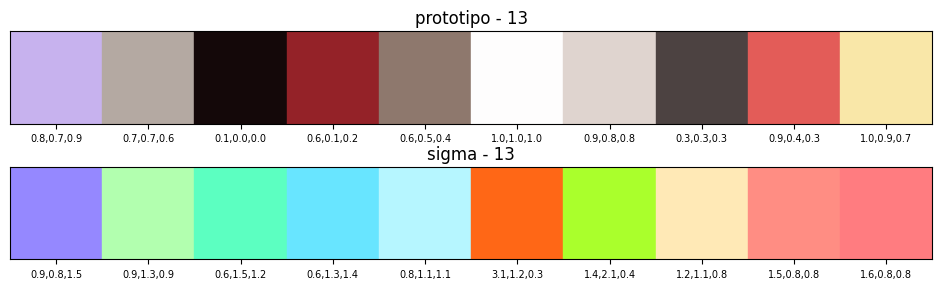

epoca: 15 funcão objetivo: 4428.90625


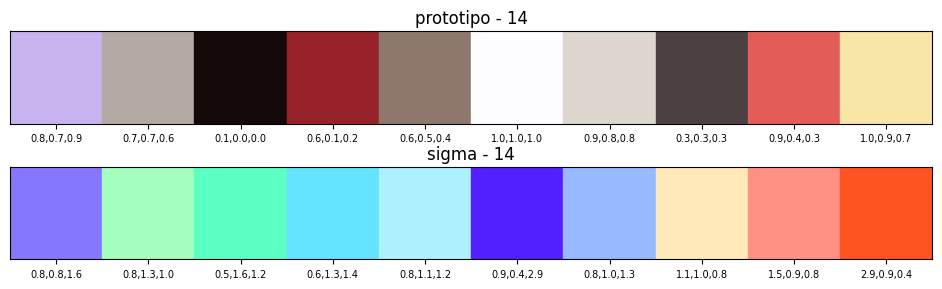

epoca: 16 funcão objetivo: 4390.435546875


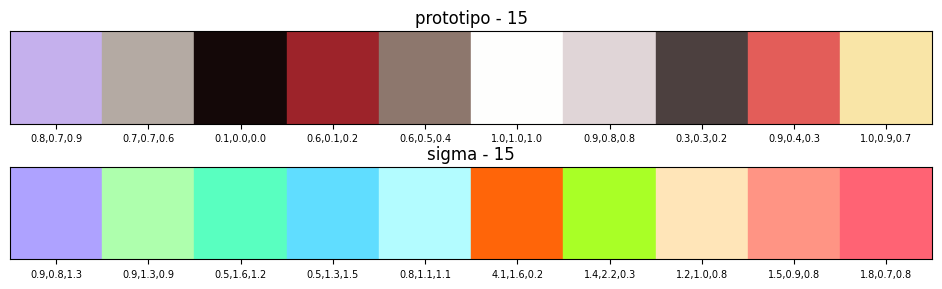

epoca: 17 funcão objetivo: 4378.77392578125


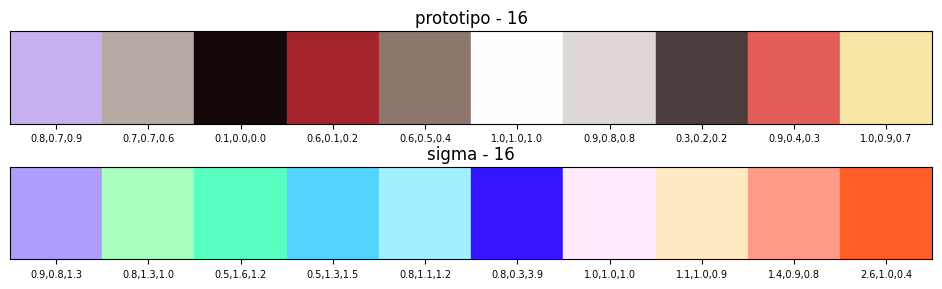

epoca: 18 funcão objetivo: 4323.6904296875


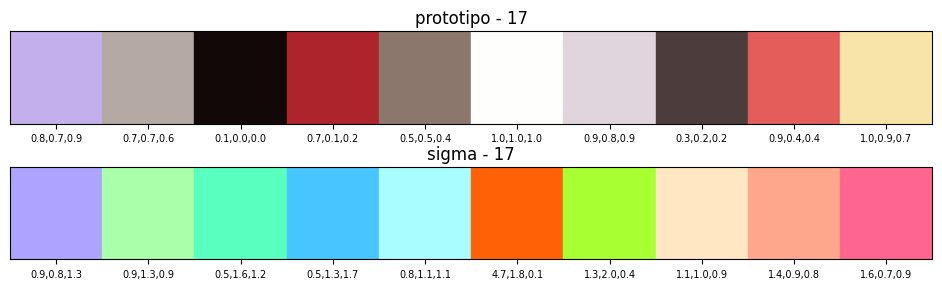

epoca: 19 funcão objetivo: 4276.5595703125


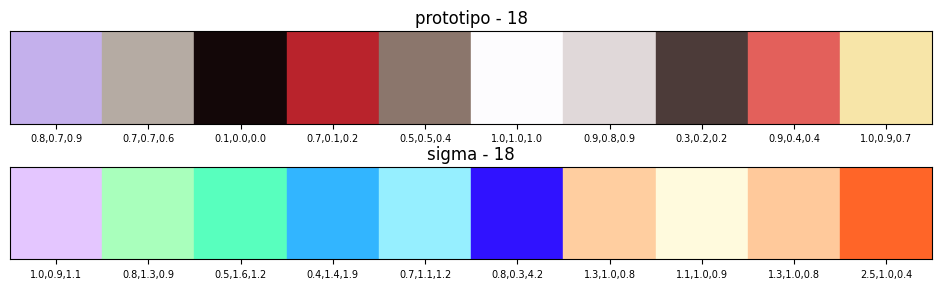

epoca: 20 funcão objetivo: 4197.9501953125


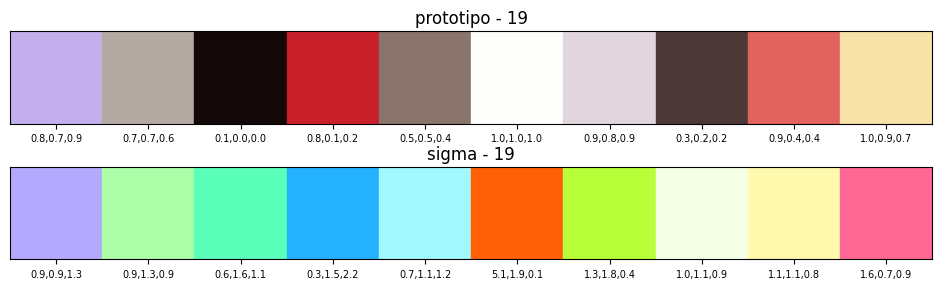

epoca: 21 funcão objetivo: 4145.25634765625


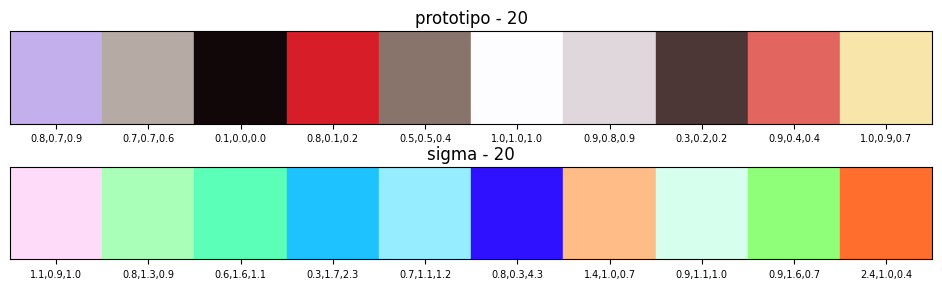

epoca: 22 funcão objetivo: 4103.6728515625


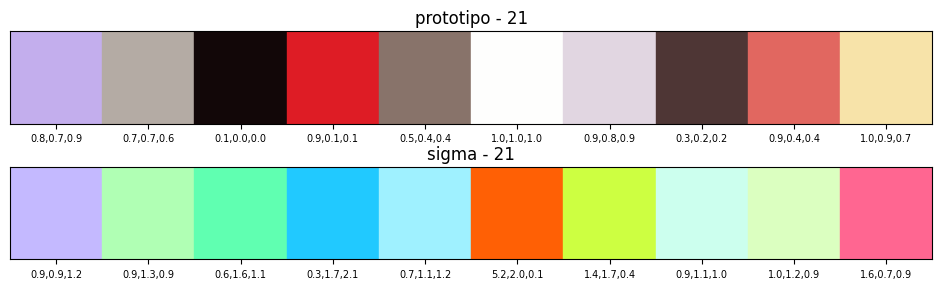

epoca: 23 funcão objetivo: 4122.08544921875


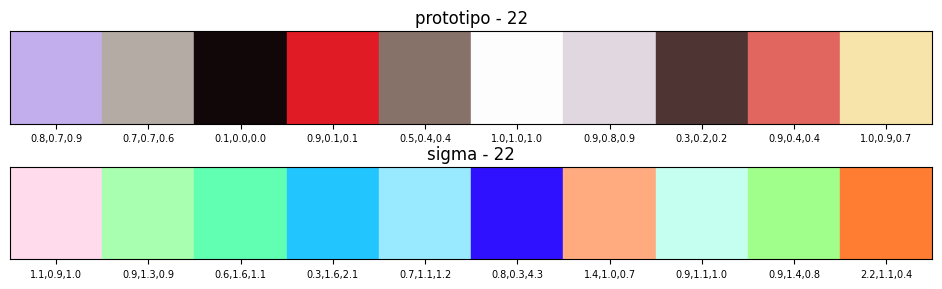

epoca: 24 funcão objetivo: 4080.853515625


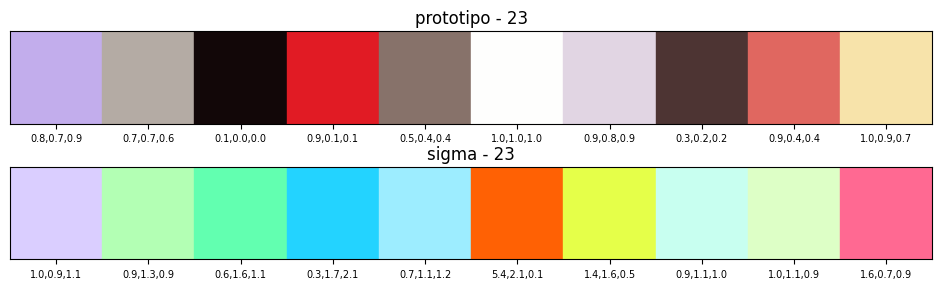

epoca: 25 funcão objetivo: 4107.318359375


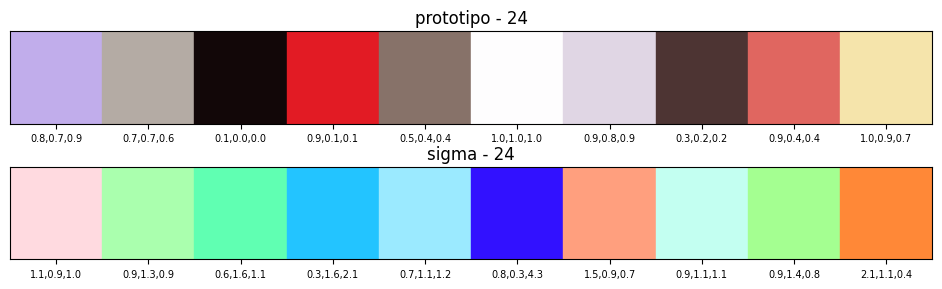

epoca: 26 funcão objetivo: 4074.1220703125


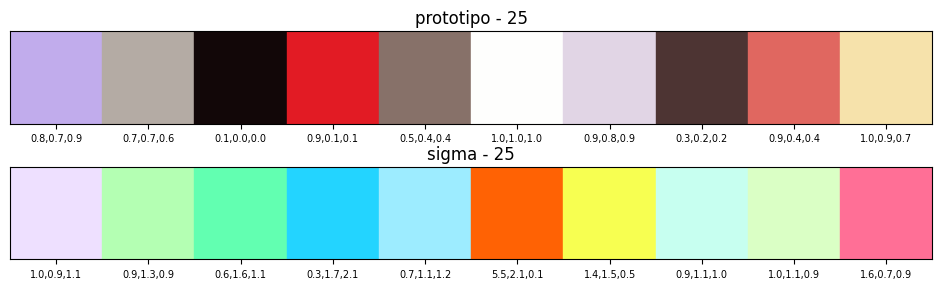

epoca: 27 funcão objetivo: 4097.1875


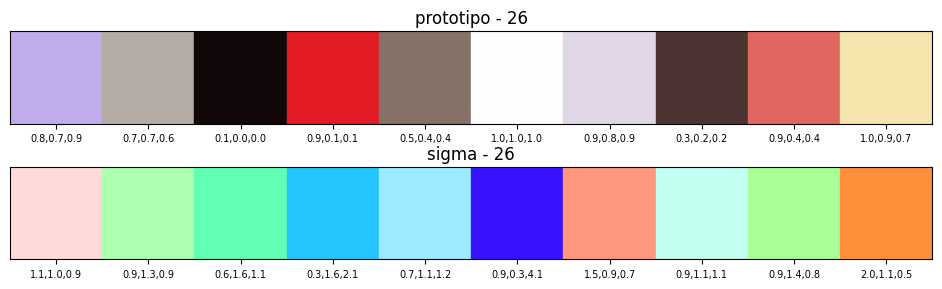

epoca: 28 funcão objetivo: 4074.3203125


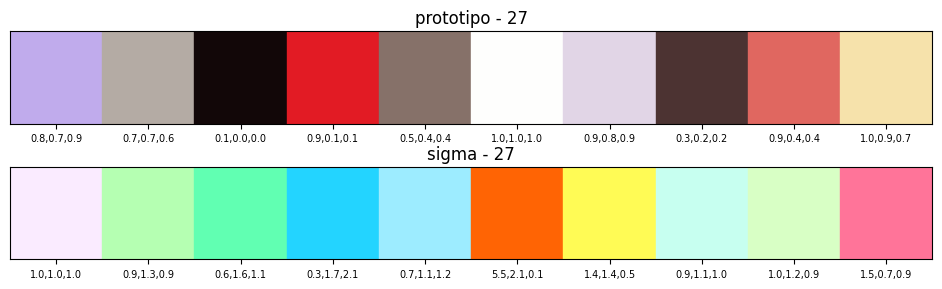

epoca: 29 funcão objetivo: 4091.508056640625


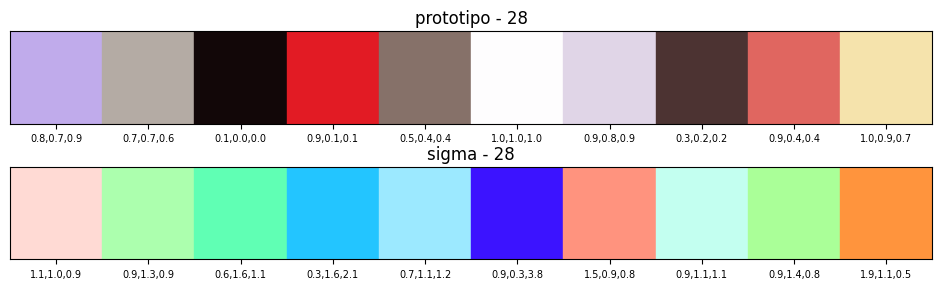

epoca: 30 funcão objetivo: 4075.847900390625


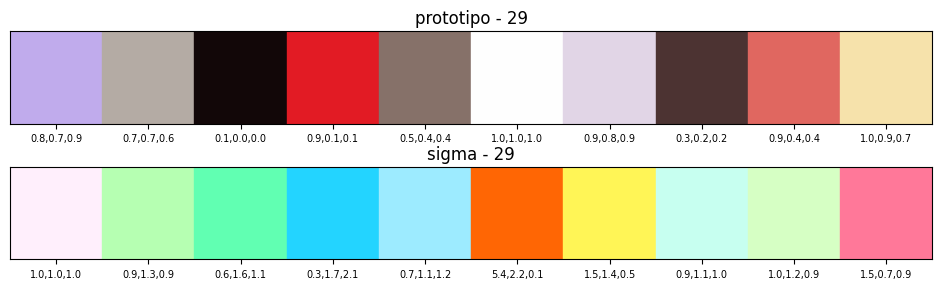

epoca: 31 funcão objetivo: 4088.72265625


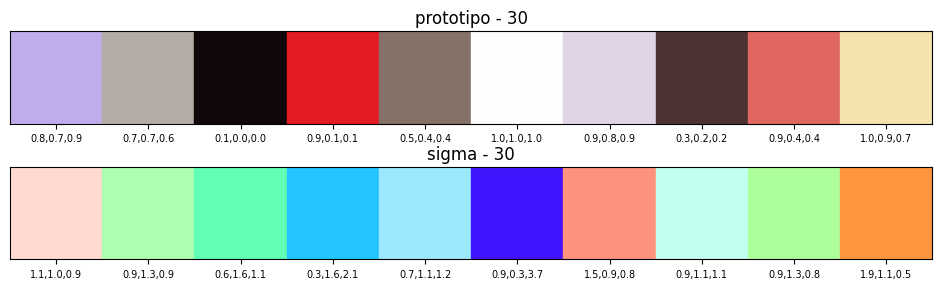

epoca: 32 funcão objetivo: 4077.02001953125


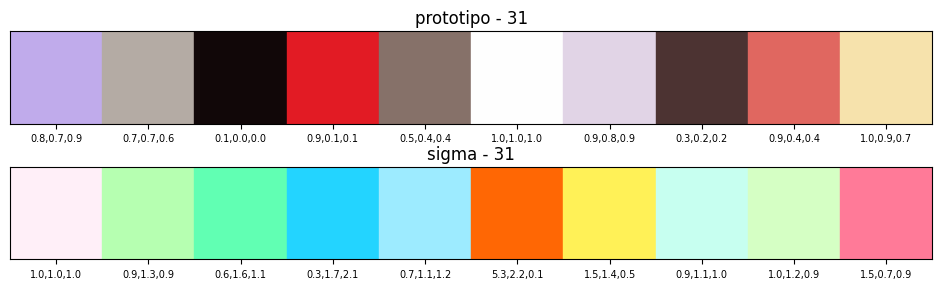

epoca: 33 funcão objetivo: 4087.4912109375


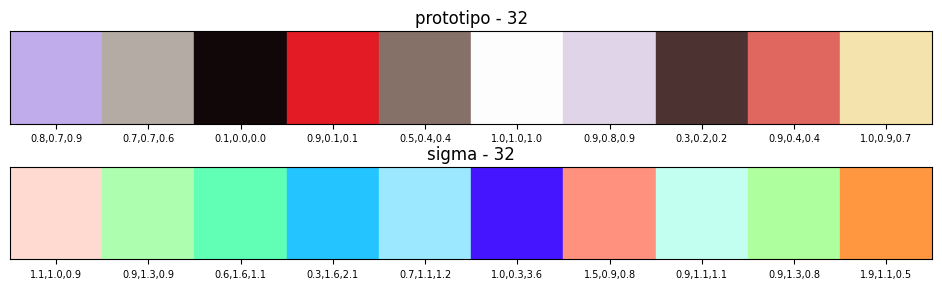

epoca: 34 funcão objetivo: 4077.6572265625


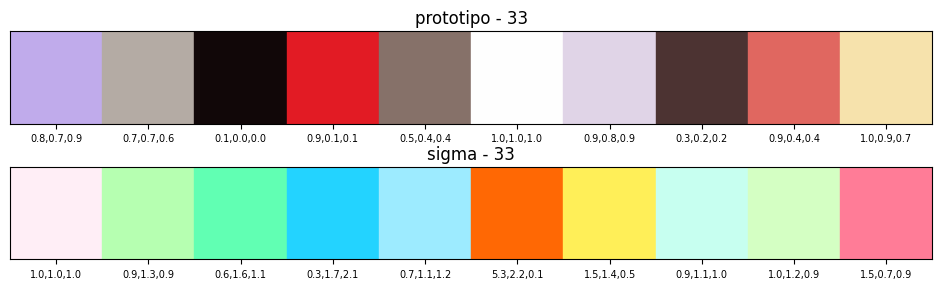

epoca: 35 funcão objetivo: 4087.0400390625


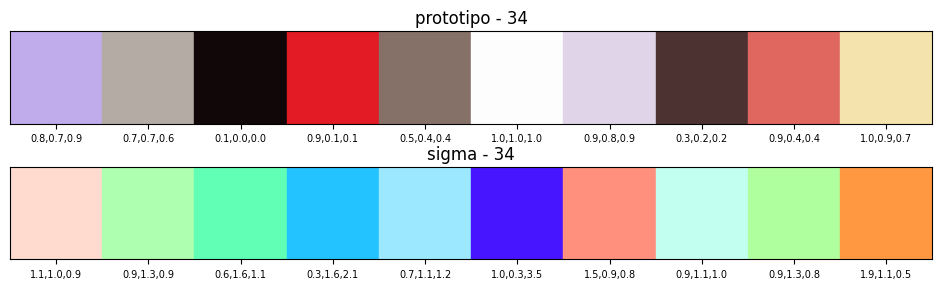

epoca: 36 funcão objetivo: 4077.895751953125


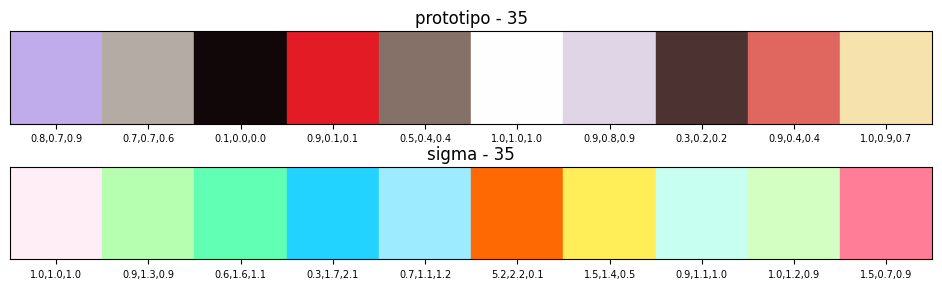

epoca: 37 funcão objetivo: 4086.978759765625


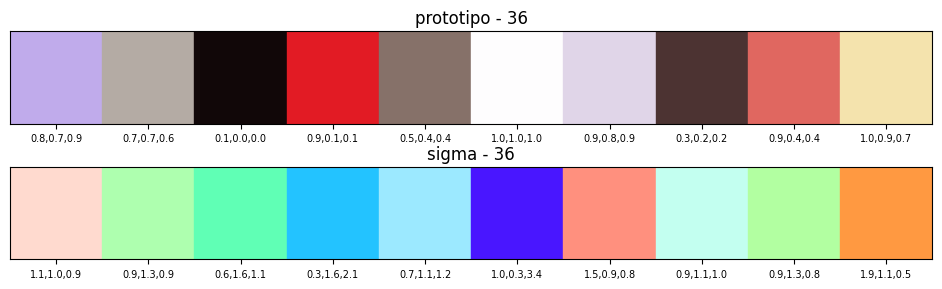

epoca: 38 funcão objetivo: 4077.87890625


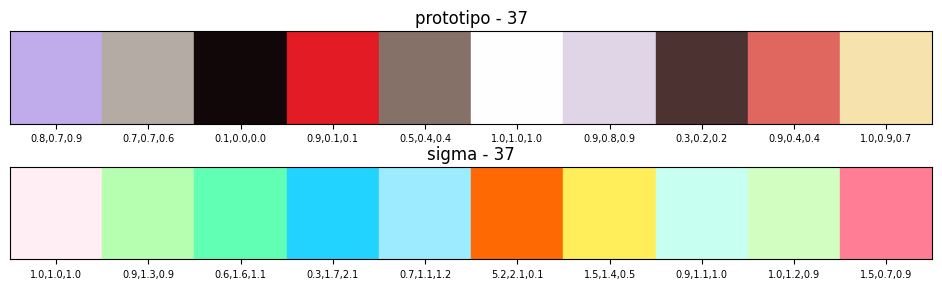

epoca: 39 funcão objetivo: 4087.111572265625


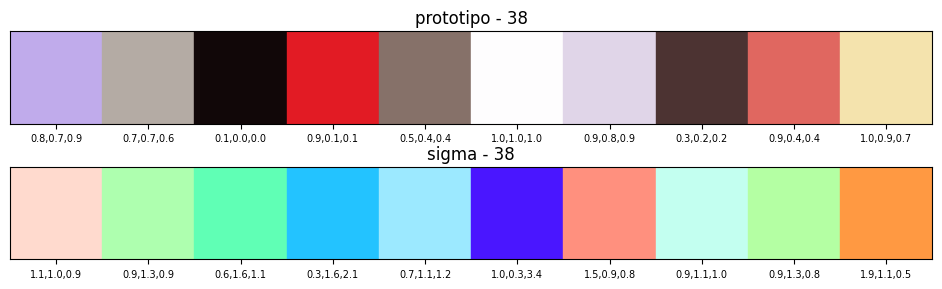

epoca: 40 funcão objetivo: 4077.710693359375


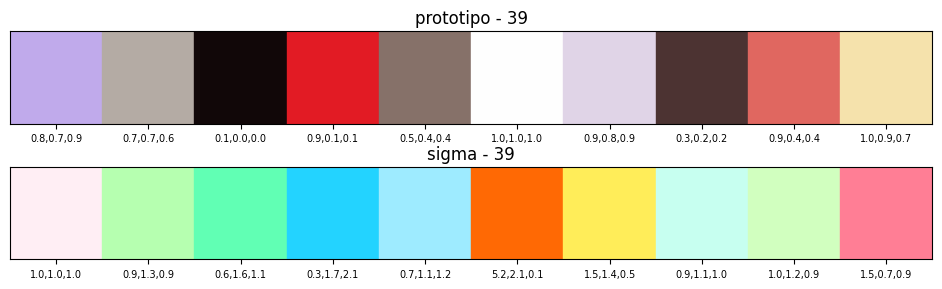

epoca: 41 funcão objetivo: 4087.3388671875


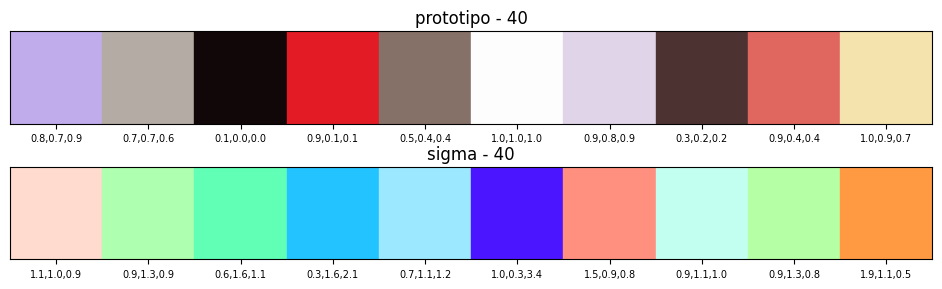

epoca: 42 funcão objetivo: 4077.457763671875


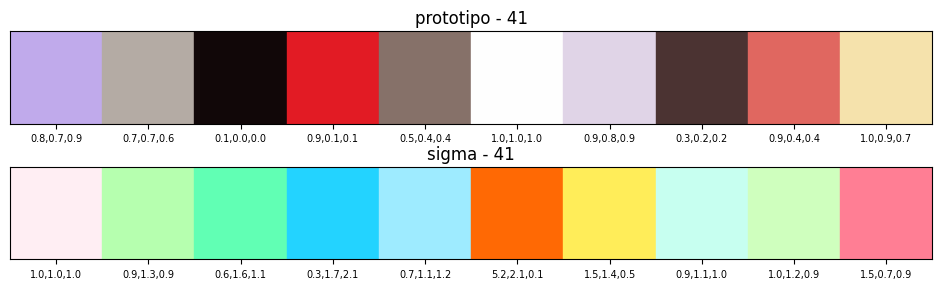

epoca: 43 funcão objetivo: 4087.610107421875


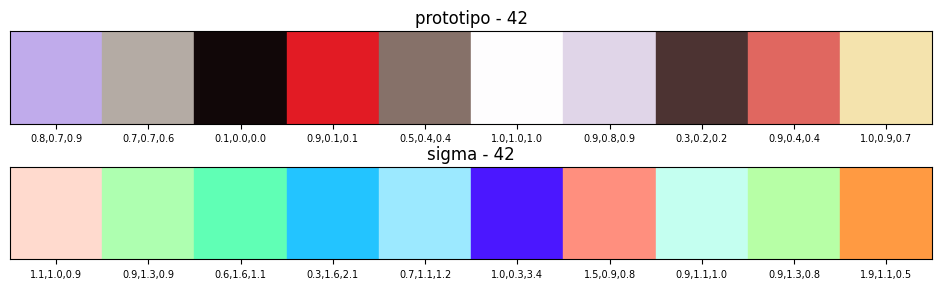

epoca: 44 funcão objetivo: 4077.16064453125


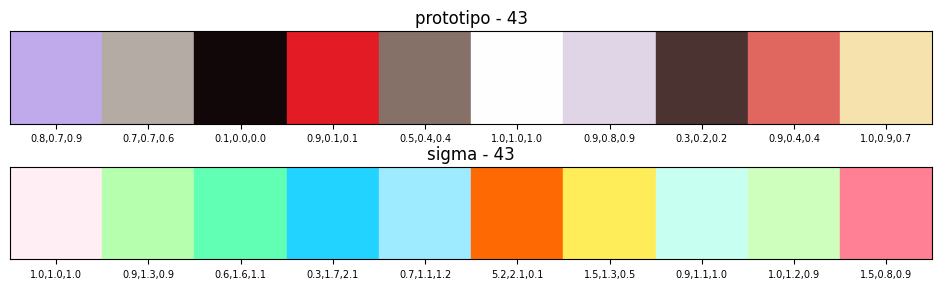

epoca: 45 funcão objetivo: 4087.896484375


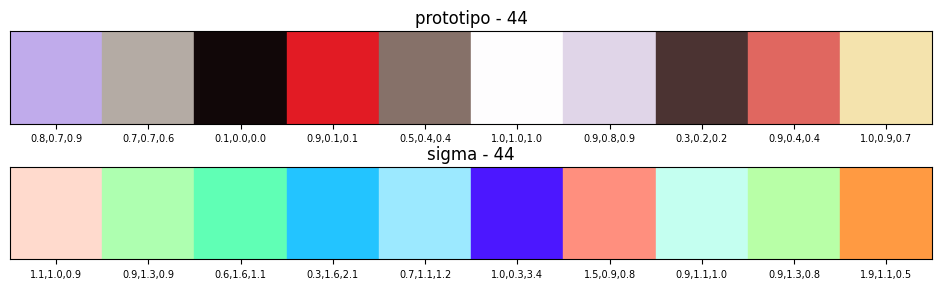

epoca: 46 funcão objetivo: 4076.84521484375


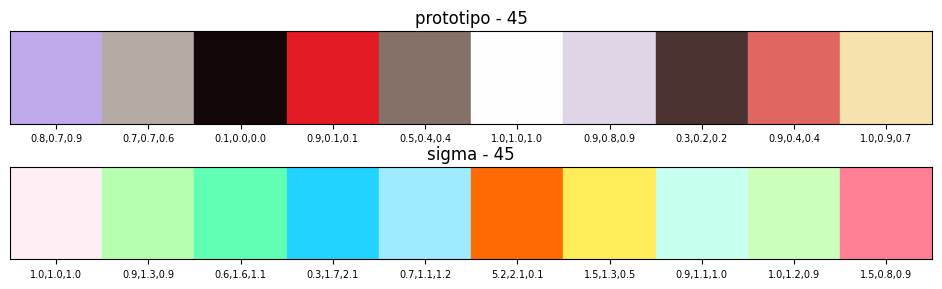

epoca: 47 funcão objetivo: 4088.184326171875


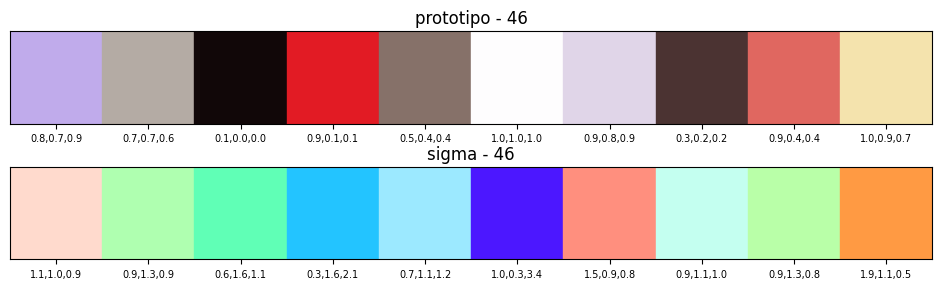

epoca: 48 funcão objetivo: 4076.526611328125


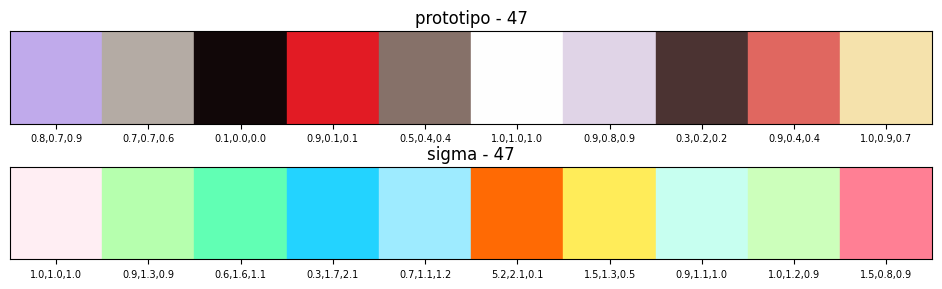

epoca: 49 funcão objetivo: 4088.4658203125


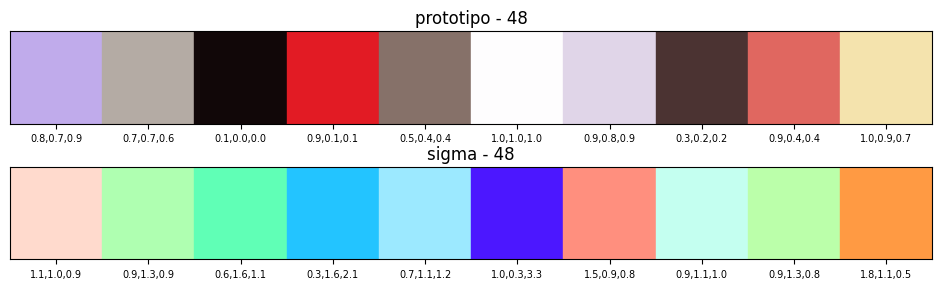

epoca: 50 funcão objetivo: 4076.212890625


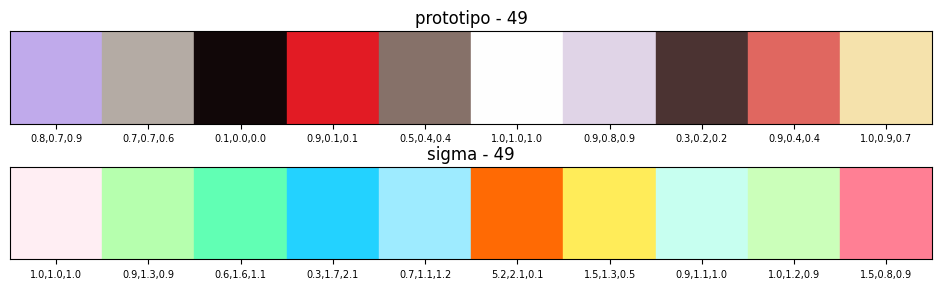

In [22]:
model = FuzzyCMeansGaussianS2(num_class=10, epochs=50, threshold=.5, verbose=True)
model.fit(X, None)

In [23]:
model.G

array([[0.75145596, 0.66928348, 0.92069871],
       [0.70578034, 0.67114291, 0.64315685],
       [0.06810418, 0.02681605, 0.02987328],
       [0.88623242, 0.10422493, 0.14191053],
       [0.52461559, 0.442237  , 0.41031609],
       [0.99621306, 0.99341899, 0.99711011],
       [0.87714533, 0.83336239, 0.91105519],
       [0.29596207, 0.19841756, 0.19529688],
       [0.87828906, 0.40282782, 0.3773438 ],
       [0.95730356, 0.89010783, 0.67696351]])

In [24]:
model.sigma

array([[1.1342692 , 0.9689489 , 0.9098776 ],
       [0.87768334, 1.2816678 , 0.8889691 ],
       [0.5823496 , 1.5530694 , 1.1056696 ],
       [0.2927949 , 1.6217968 , 2.105911  ],
       [0.7409342 , 1.110307  , 1.2155625 ],
       [1.0023371 , 0.2985537 , 3.3416712 ],
       [1.5337296 , 0.8616728 , 0.756674  ],
       [0.854835  , 1.1150377 , 1.0491273 ],
       [0.9320909 , 1.2659456 , 0.84747463],
       [1.8466487 , 1.1171076 , 0.48475325]], dtype=float32)

In [25]:
y = model.predict(X)

In [26]:
y_image = (model.G[y].reshape(image_shape_out)*255).astype(np.uint8)

In [27]:
image.shape, y_image.shape

((661, 569, 3), (661, 569, 3))

import cv2
filename = img_path.split("/")[-1]
set_name = "results/minimal_v2/cmeans/comics/"
model.save_model(dir_out_model)

print(str.upper(filename.split(".")[-1]))
dir_out_img = f"{set_name}imgs/20/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)
Image.fromarray(y_image).save(f"{dir_out_img}{filename}", quality=90)
ssim, hssim, q = metricas(image, y_image)
resultados.append([ssim, hssim, q])

In [28]:
filename = img_path.split("/")[-1]
set_name = f"results/{model_modo}/cmeans/comics/"
model.save_model(f"{set_name}model/10/model.json")

dir_out_img = f"{set_name}imgs/10/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)

Image.fromarray(y_image).save(f"{dir_out_img}{filename}")
ssim, hssim, q = metricas(image, y_image)
resultados.append([ssim, hssim, q])

SSIM : 0.0040
SSIM entre histogramas: 0.0970
UQI: 0.9827


In [29]:
image[:2, :2], image.astype(np.float32)[:2, :2]

(array([[[255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255]]], dtype=uint8),
 array([[[255., 255., 255.],
         [255., 255., 255.]],
 
        [[255., 255., 255.],
         [255., 255., 255.]]], dtype=float32))

##### show

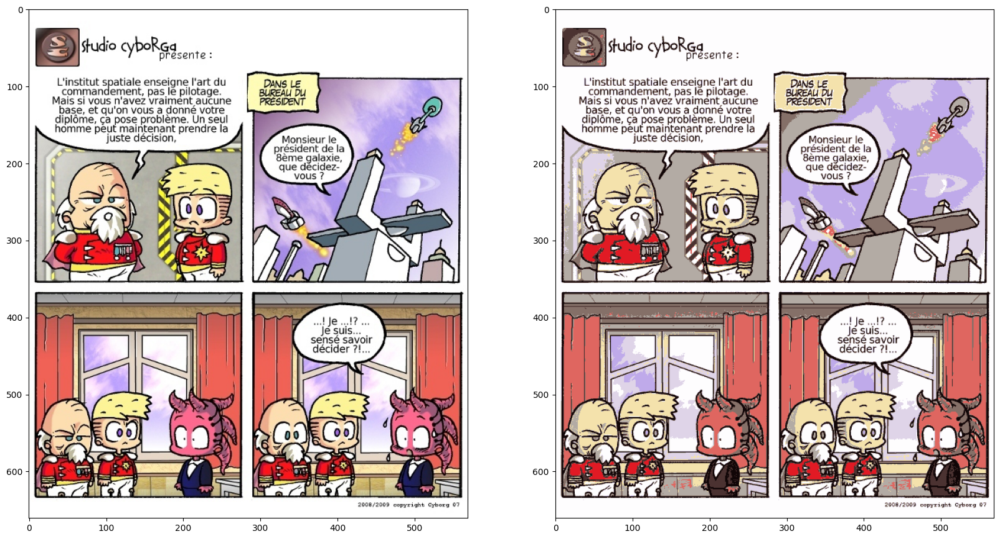

In [30]:
show_img_bbox(image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]], y_image)

In [31]:
# time change
# new row
# new column
# pure grid
# ecs_insert
# whole_row
# whole_column


#### wikiart High_Renaissance leonardo da vinci mona lisa

In [32]:
# from Pill import Image 
from PIL import Image, ImageDraw, ImageFont
import numpy as np

img_path = "./datasets/wikiart/High_Renaissance/leonardo-da-vinci_mona-lisa.jpg"
image_shape_out = 640, 640, 3
img = Image.open(img_path).convert("RGB")
img = img.resize(image_shape_out[:2])
image = np.array(img)
# image_shape_out = image.shape

print(image.shape)
X = image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]].reshape(-1, image_shape_out[2]) /255
print(X.shape)

(640, 640, 3)
(409600, 3)


In [33]:
# image 출력 함수 정의
def show_img_bbox(X, y):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate([X, y]):
        plt.subplot(1, 2, i+1)
        plt.imshow(img)


#### c = 20

##### fit

epoca: 0 funcão objetivo: 1851.8474
epoca: 1 funcão objetivo: 1377.1468505859375


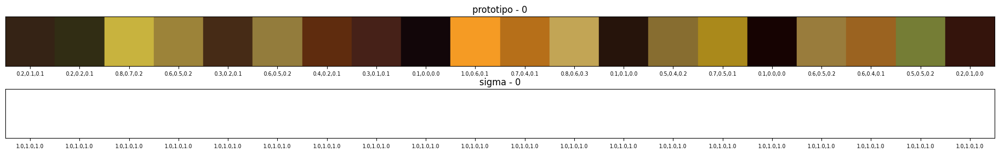

epoca: 2 funcão objetivo: 1193.32080078125


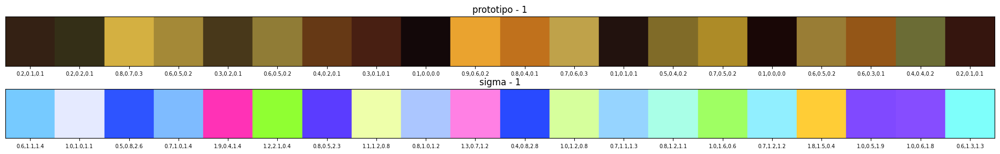

epoca: 3 funcão objetivo: 1085.38134765625


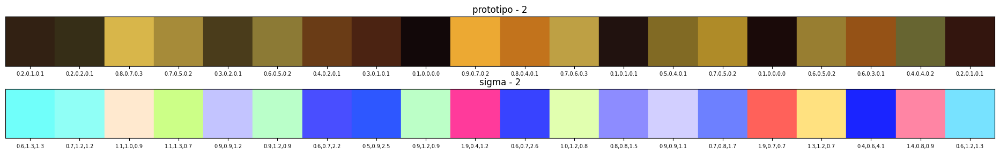

epoca: 4 funcão objetivo: 975.6892700195312


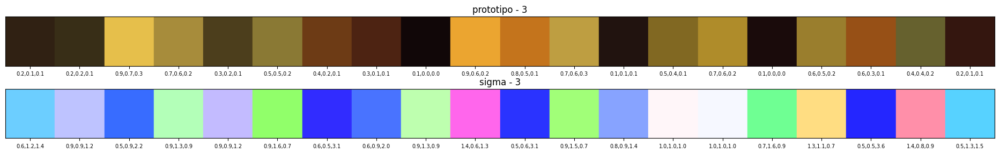

epoca: 5 funcão objetivo: 939.4765625


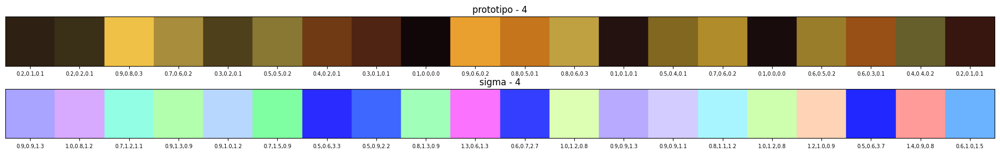

epoca: 6 funcão objetivo: 920.632080078125


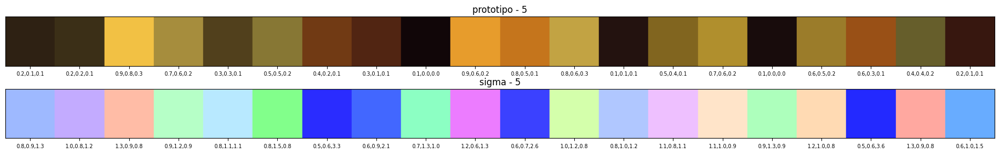

epoca: 7 funcão objetivo: 908.3831176757812


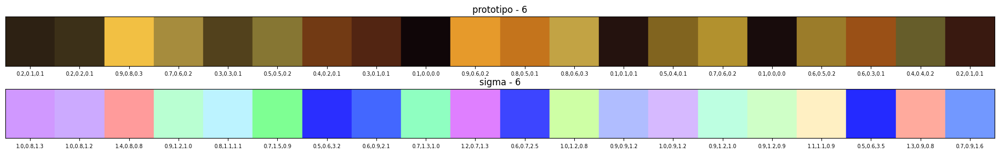

epoca: 8 funcão objetivo: 899.5928955078125


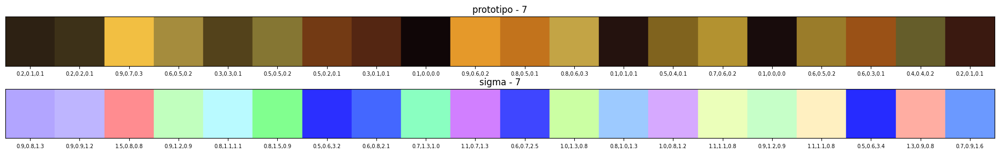

epoca: 9 funcão objetivo: 894.669921875


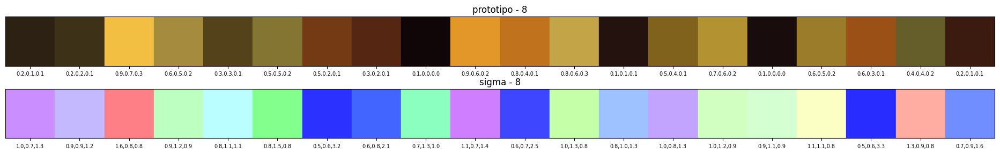

epoca: 10 funcão objetivo: 889.7898559570312


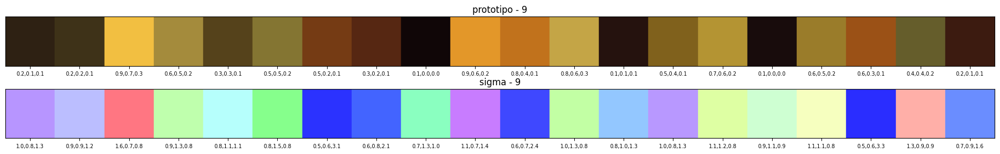

epoca: 11 funcão objetivo: 887.3253173828125


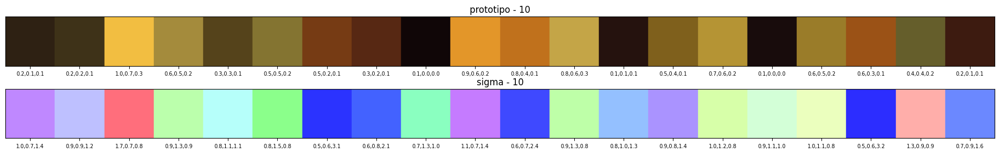

epoca: 12 funcão objetivo: 884.3862915039062


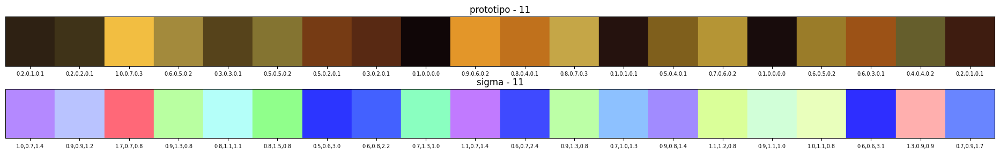

epoca: 13 funcão objetivo: 882.5133666992188


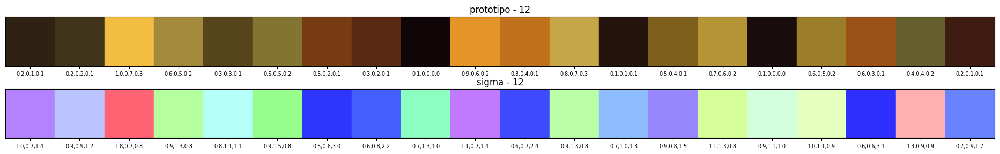

epoca: 14 funcão objetivo: 880.4166870117188


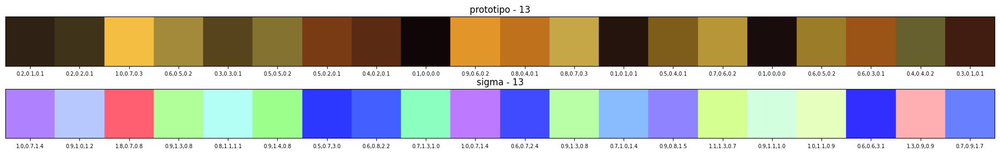

epoca: 15 funcão objetivo: 878.7816772460938


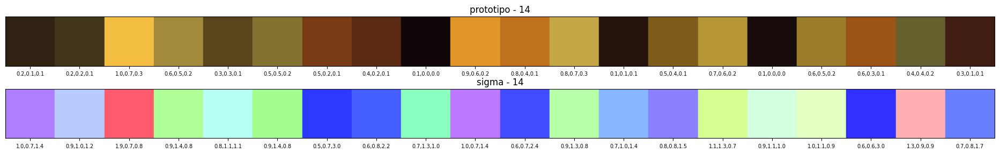

epoca: 16 funcão objetivo: 877.14501953125


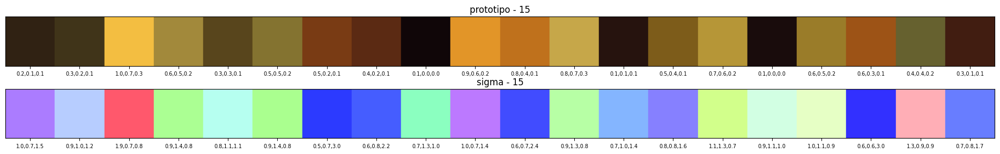

epoca: 17 funcão objetivo: 875.7347412109375


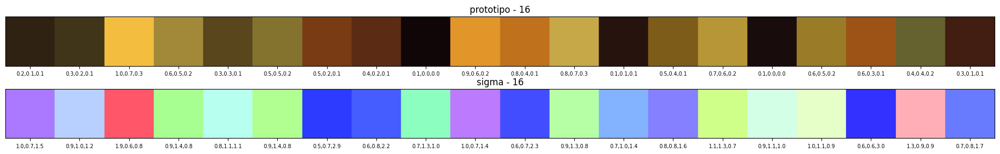

epoca: 18 funcão objetivo: 874.3423461914062


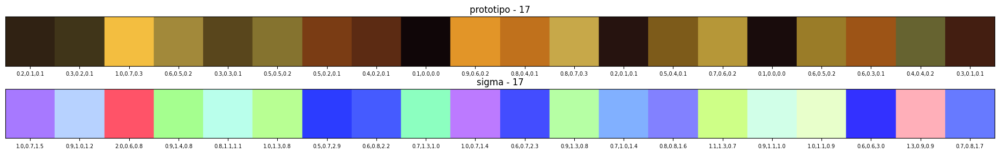

epoca: 19 funcão objetivo: 873.0855102539062


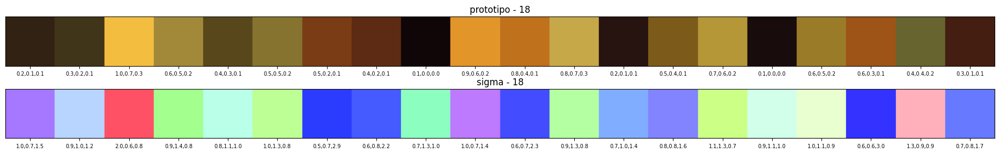

epoca: 20 funcão objetivo: 871.8953247070312


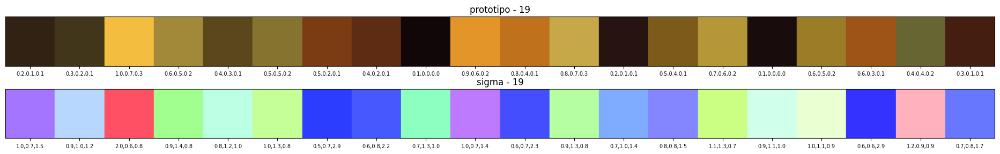

epoca: 21 funcão objetivo: 870.8265991210938


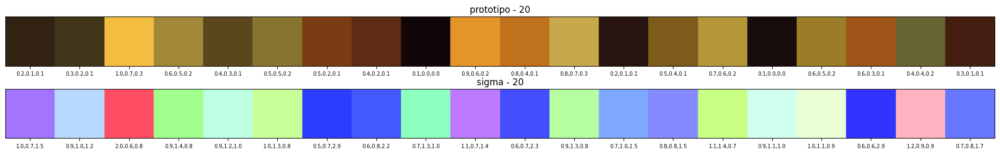

epoca: 22 funcão objetivo: 869.8328857421875


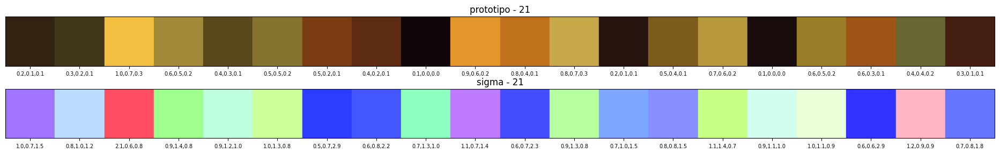

epoca: 23 funcão objetivo: 868.9335327148438


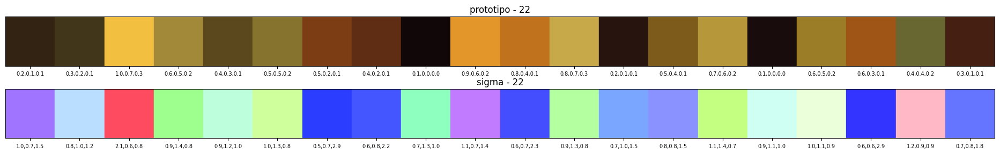

epoca: 24 funcão objetivo: 868.0922241210938


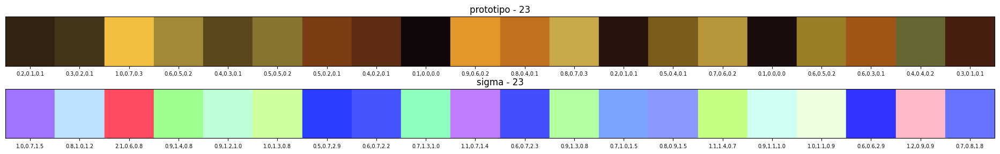

epoca: 25 funcão objetivo: 867.3244018554688


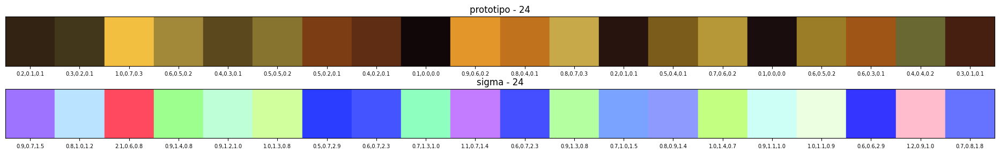

epoca: 26 funcão objetivo: 866.6109619140625


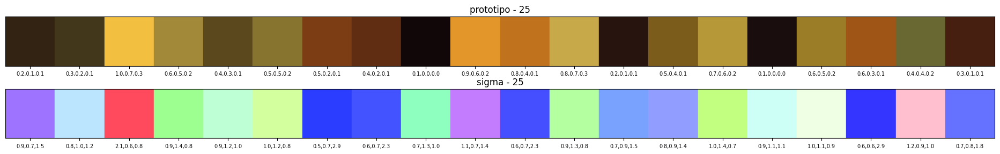

epoca: 27 funcão objetivo: 865.956787109375


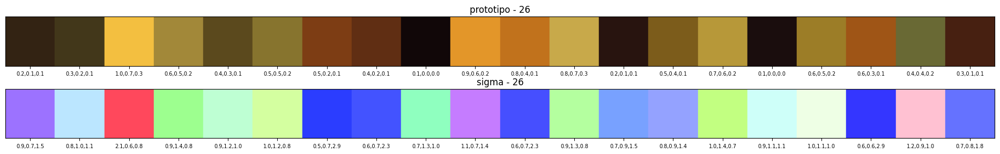

epoca: 28 funcão objetivo: 865.3373413085938


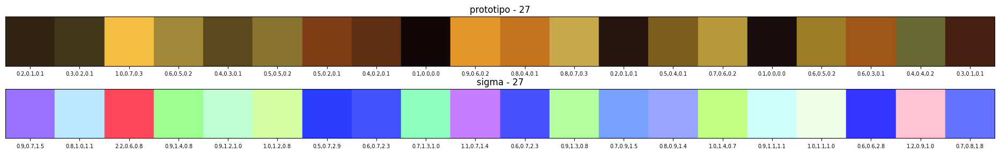

epoca: 29 funcão objetivo: 864.7462768554688


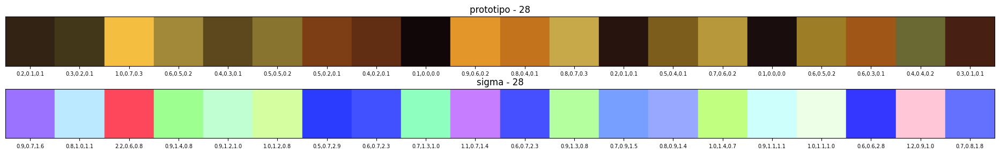

epoca: 30 funcão objetivo: 864.1663818359375


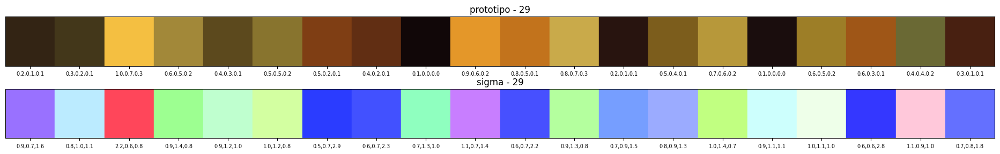

epoca: 31 funcão objetivo: 863.6002197265625


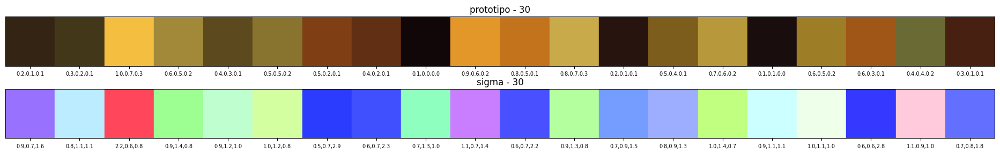

epoca: 32 funcão objetivo: 863.0487060546875


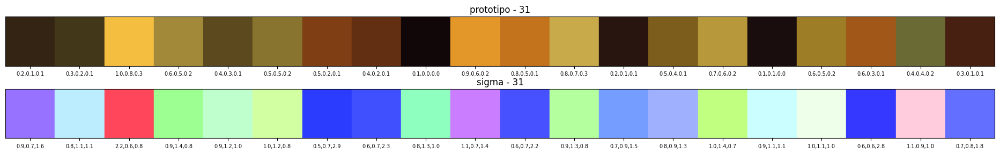

epoca: 33 funcão objetivo: 862.5255126953125


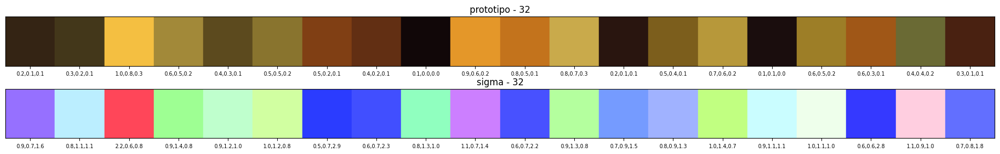

epoca: 34 funcão objetivo: 862.0350341796875


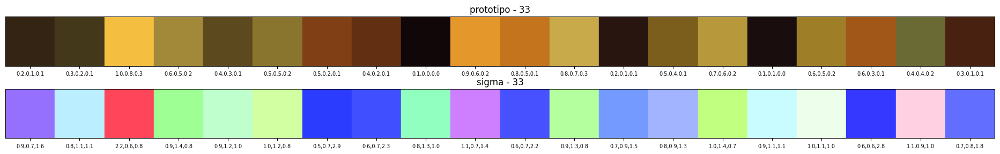

In [34]:
model = FuzzyCMeansGaussianS2(num_class=20, epochs=50, threshold=.5, verbose=True)
model.fit(X, None)

In [35]:
model.G

array([[0.20312279, 0.14022917, 0.07685356],
       [0.26322053, 0.21795758, 0.10187079],
       [0.95572335, 0.75059197, 0.25345893],
       [0.6358967 , 0.53589556, 0.224577  ],
       [0.36078903, 0.28906589, 0.11607485],
       [0.53621613, 0.45718378, 0.18124639],
       [0.50269757, 0.24632276, 0.07844692],
       [0.38637163, 0.18476213, 0.0755959 ],
       [0.06581899, 0.02622788, 0.03052523],
       [0.89365536, 0.59393606, 0.16282388],
       [0.76370622, 0.45301208, 0.11066508],
       [0.78732199, 0.66592516, 0.29275788],
       [0.15978805, 0.0811889 , 0.05863129],
       [0.48518349, 0.36741352, 0.11067711],
       [0.71840091, 0.59673898, 0.22681522],
       [0.10172746, 0.05041691, 0.04994831],
       [0.61831881, 0.49531484, 0.15163313],
       [0.62861838, 0.34134184, 0.08907446],
       [0.41658159, 0.41633478, 0.20594007],
       [0.28664828, 0.12831798, 0.06813385]])

In [36]:
model.sigma

array([[0.9211963 , 0.69044185, 1.5722468 ],
       [0.82967055, 1.0636775 , 1.133142  ],
       [2.192038  , 0.59669894, 0.7645337 ],
       [0.87237424, 1.4071387 , 0.81462973],
       [0.88784236, 1.1834533 , 0.9517283 ],
       [1.018791  , 1.2449794 , 0.7884111 ],
       [0.49483556, 0.6877841 , 2.9382384 ],
       [0.58918124, 0.7246976 , 2.3420398 ],
       [0.75147897, 1.3330336 , 0.9982563 ],
       [1.0890877 , 0.6765406 , 1.3571981 ],
       [0.63219535, 0.710955  , 2.22488   ],
       [0.9287718 , 1.3178389 , 0.8170124 ],
       [0.69977987, 0.9302295 , 1.5362024 ],
       [0.83018255, 0.9212368 , 1.3075404 ],
       [1.0398916 , 1.3762826 , 0.6987218 ],
       [0.8574073 , 1.0734316 , 1.0865217 ],
       [0.9795744 , 1.0526428 , 0.9697986 ],
       [0.57936877, 0.6222338 , 2.7739031 ],
       [1.1155701 , 0.9089457 , 0.9862005 ],
       [0.69721824, 0.7870518 , 1.8223338 ]], dtype=float32)

In [37]:
y = model.predict(X)

In [38]:
y_image = (model.G[y].reshape(image_shape_out)*255).astype(np.uint8)

In [39]:
filename = img_path.split("/")[-1]
set_name = f"results/{model_modo}/cmeans/art/"
model.save_model(f"{set_name}model/20/model.json")

dir_out_img = f"{set_name}imgs/20/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)

Image.fromarray(y_image).save(f"{dir_out_img}{filename}")
ssim, hssim, q = metricas(image, y_image)
resultados.append([ssim, hssim, q])

SSIM : 0.9221
SSIM entre histogramas: 0.2345
UQI: 0.9938


##### show

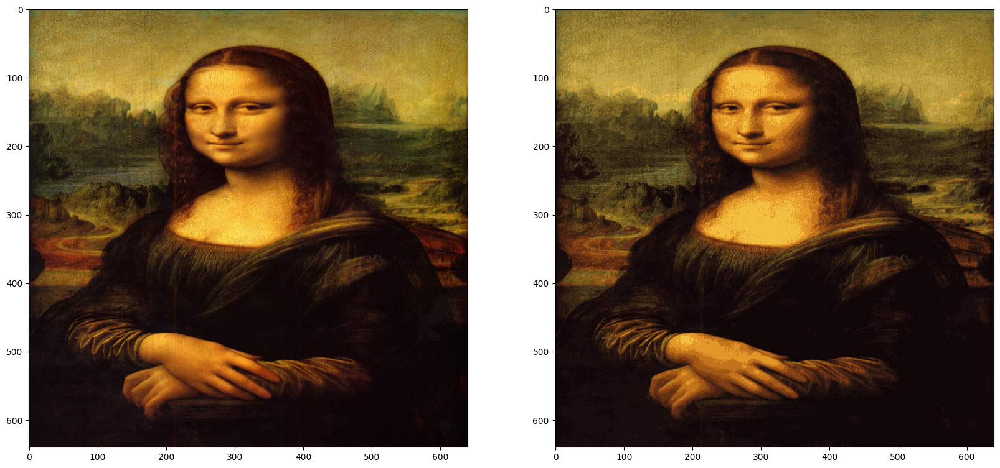

In [40]:
show_img_bbox(image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]], y_image)

#### c = 10

##### fit

epoca: 0 funcão objetivo: 5638.7275
epoca: 1 funcão objetivo: 2461.185302734375


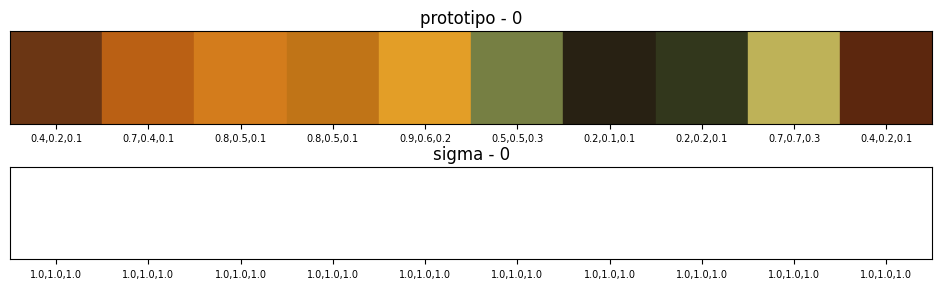

epoca: 2 funcão objetivo: 2230.685546875


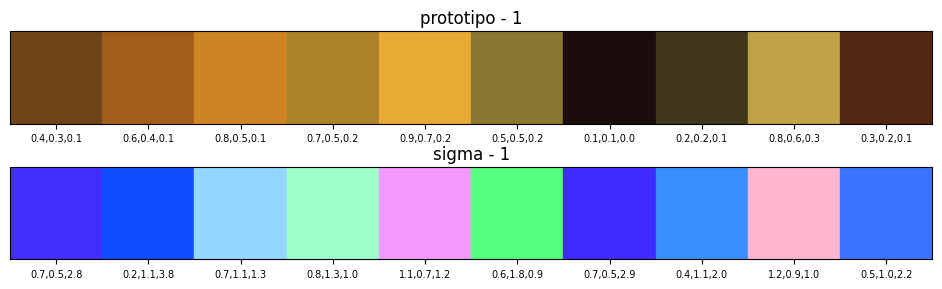

epoca: 3 funcão objetivo: 2102.67431640625


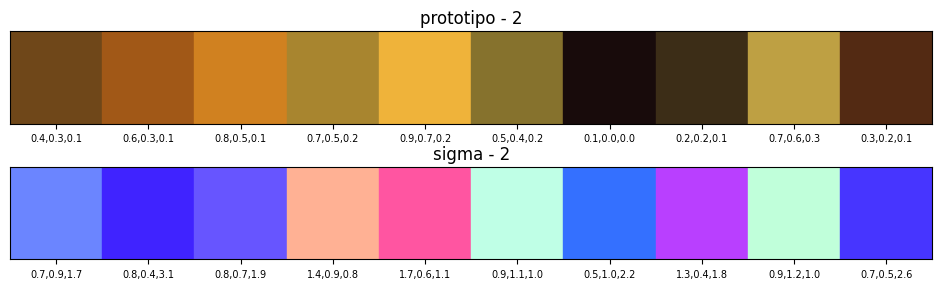

epoca: 4 funcão objetivo: 1951.3160400390625


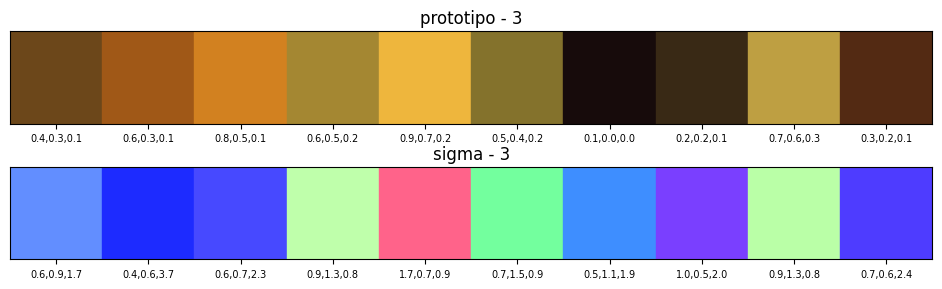

epoca: 5 funcão objetivo: 1861.8773193359375


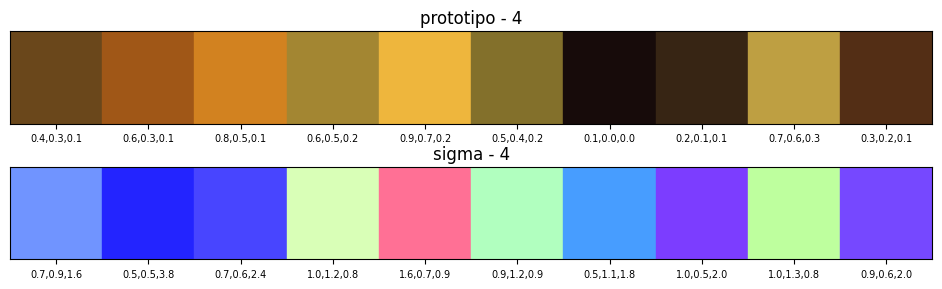

epoca: 6 funcão objetivo: 1800.392333984375


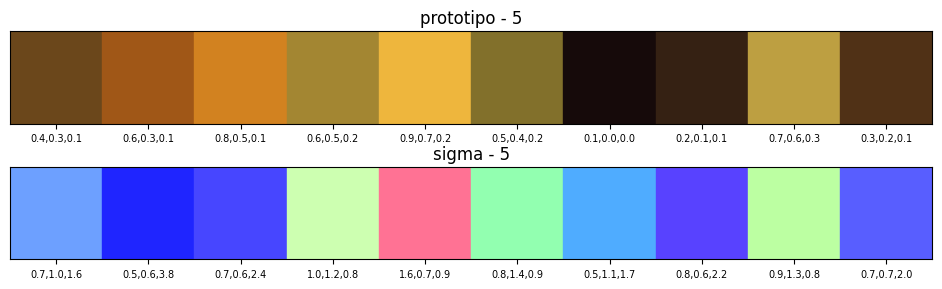

epoca: 7 funcão objetivo: 1794.2587890625


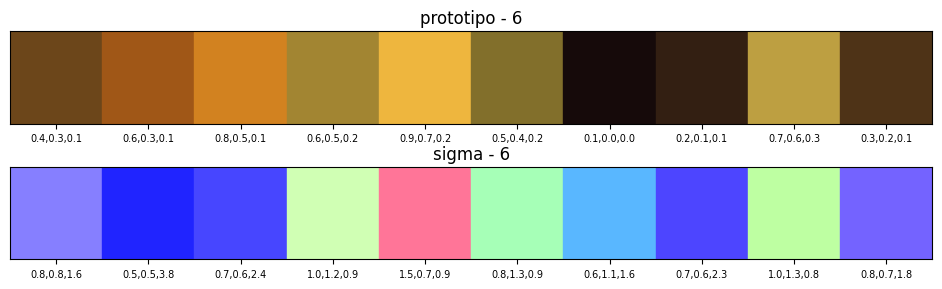

epoca: 8 funcão objetivo: 1778.03173828125


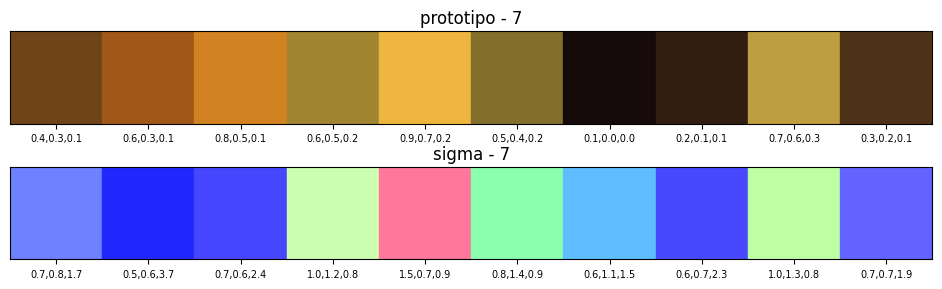

epoca: 9 funcão objetivo: 1779.15478515625


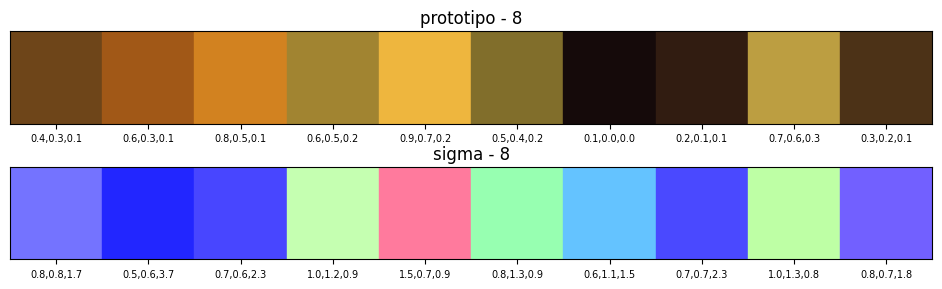

epoca: 10 funcão objetivo: 1771.120361328125


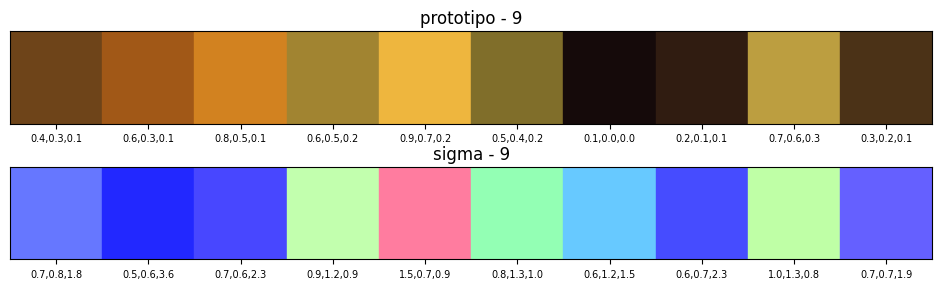

epoca: 11 funcão objetivo: 1772.0947265625


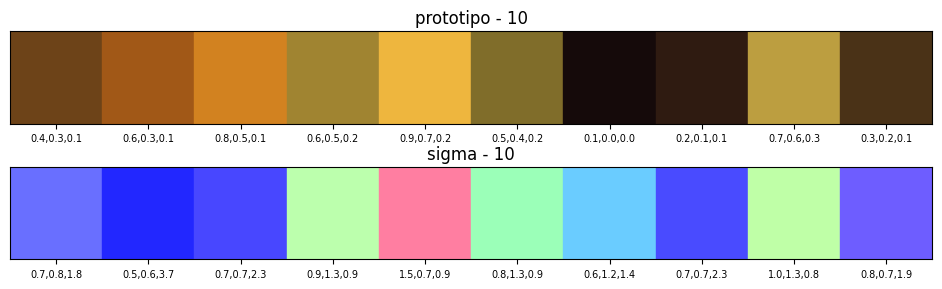

epoca: 12 funcão objetivo: 1767.110107421875


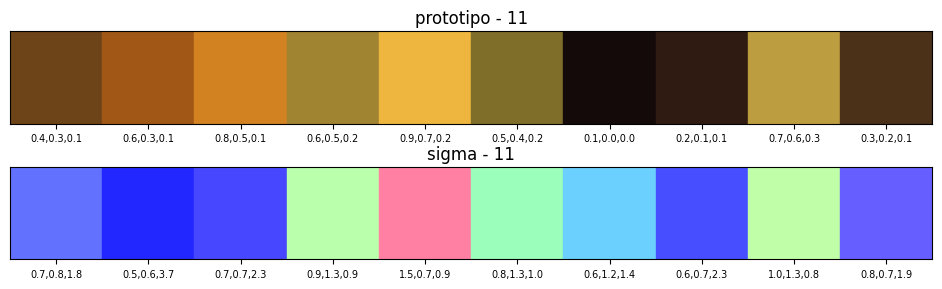

epoca: 13 funcão objetivo: 1767.45068359375


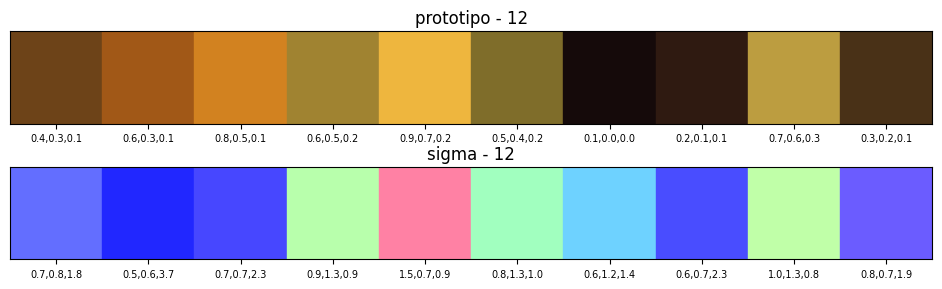

In [41]:
model = FuzzyCMeansGaussianS2(num_class=10, epochs=50, threshold=.5, verbose=True)
model.fit(X, None)

In [42]:
model.G

array([[0.42604453, 0.26140956, 0.09518732],
       [0.63172342, 0.34516222, 0.08927099],
       [0.82266525, 0.50892526, 0.12727429],
       [0.62684867, 0.51546046, 0.19213132],
       [0.93180928, 0.7140363 , 0.24199786],
       [0.49725839, 0.42649265, 0.16462476],
       [0.08262857, 0.03741902, 0.03936804],
       [0.18250595, 0.10355862, 0.06533859],
       [0.73584286, 0.61659926, 0.25123116],
       [0.28724378, 0.1918346 , 0.09055347]])

In [43]:
model.sigma

array([[0.705867  , 0.7828807 , 1.8095957 ],
       [0.48376027, 0.5593728 , 3.6954596 ],
       [0.65447044, 0.65204865, 2.3433113 ],
       [0.917208  , 1.273183  , 0.8563304 ],
       [1.4522144 , 0.7367587 , 0.9346392 ],
       [0.81160337, 1.2837981 , 0.9597529 ],
       [0.60982656, 1.1621071 , 1.4110665 ],
       [0.6461101 , 0.6851078 , 2.259095  ],
       [0.95116884, 1.261613  , 0.8333285 ],
       [0.78720474, 0.67539173, 1.8808603 ]], dtype=float32)

In [44]:
y = model.predict(X)

In [45]:
y_image = (model.G[y].reshape(image_shape_out)*255).astype(np.uint8)

In [46]:
filename = img_path.split("/")[-1]
set_name = f"results/{model_modo}/cmeans/art/"
model.save_model(f"{set_name}model/10/model.json")

dir_out_img = f"{set_name}imgs/10/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)

Image.fromarray(y_image).save(f"{dir_out_img}{filename}")
ssim, hssim, q = metricas(image, y_image)
resultados.append([ssim, hssim, q])
# metricas(image, y_image)

SSIM : 0.8460
SSIM entre histogramas: 0.1261
UQI: 0.9880


##### show

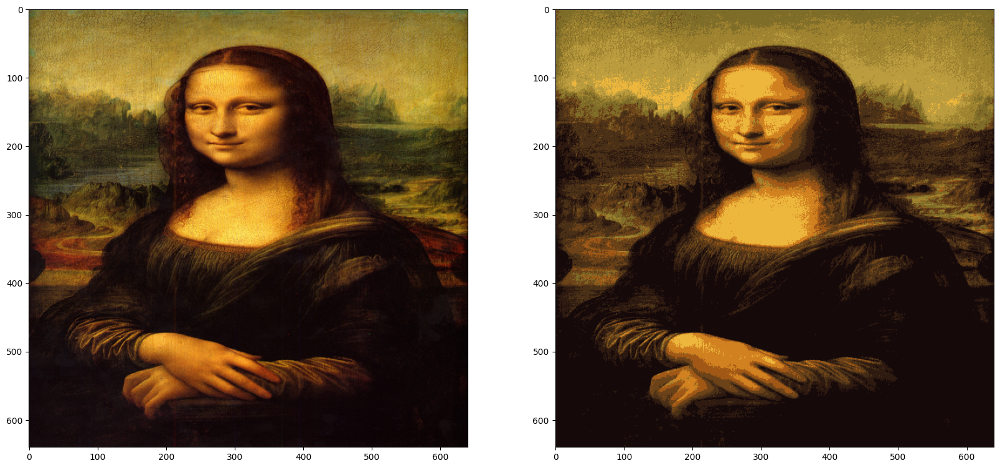

In [47]:
show_img_bbox(image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]], y_image)

In [48]:
# time change
# new row
# new column
# pure grid
# ecs_insert
# whole_row
# whole_column


In [51]:
os.makedirs(f"results/{model_modo}/cmeans", exist_ok=True)
pd.DataFrame(
    np.array(resultados).T, index=["ssim", "hssim", "uqi"]
).T.to_csv(f"results/{model_modo}/cmeans/metricas.csv")
print(resultados)

[[0.004033440783579751, 0.043611010460003784, 0.9898240386084682], [0.00403360823309598, 0.09703150589941874, 0.9826792757583672], [0.9221393300974748, 0.23448793495092626, 0.9938449771464802], [0.846044516043917, 0.1261176646018158, 0.987962754238759]]
